# Capstone Project: UN Sustainable Development Goals Text Classification

The Uniter Nations created 17 measurable indicators for development called the Sustainable Development Goals or SCG, they consists of: 

1. No Poverty
2. Zero Hunger
3. Good Health and Well Being
4. Quality Education
5. Gender Equality
6. Clean Water and Sanitation
7. Affordable and Clean Energy
8. Decent Work and Economic Growth
9. Industry, Innovation, and Infrastructure
10. Reduced Inequalities
11. Sustainable Cities and Communities
12. Responsible Consumption and Production
13. Climate Action
14. Life Below Water
15. Life on Land
16. Peace, Justice and String Institutions
17. Partnerships


Each SDG has several “targets”, or social outcomes that the UN hopes to achieve by 2030. Each of these targets is measured using a set of indicators. These indicators represent the quantitative measurements that will be used to judge whether each SDG target has been achieved or not by 2030.

I will be classifying text content by its relevance to the measurable indicators of the United Nations’ Sustainable Development Goal 3: Health and Well-Being or being refer as SDG 3. SDG 3 has 14 targets and 27 indicators.

##### The SDG 3 Indicators

Theere are 27 possible SDG 3 indicators, in the dataset each indicator will be refer using code, e.g. "3.1.1":

- 3.1.1 - Maternal mortality ratio
- 3.1.2 - Proportion of births attended by skilled health personnel
- 3.2.1 - Under-5 mortality rate
- 3.2.2 - Neonatal mortality rate
- 3.3.1 - Number of new HIV infections per 1 000 uninfected population, by sex, age and key populations
- 3.3.2 - Tuberculosis incidence per 100 000 population
- 3.3.3 - Malaria incidence per 1 000 population
- 3.3.4 - Hepatitis B incidence per 100 000 population
- 3.3.5 - Number of people requiring interventions against neglected tropical diseases
- 3.4.1 - Mortality rate attributed to cardiovascular disease, cancer, diabetes or chronic respiratory disease
- 3.4.2 - Suicide mortality rate
- 3.5.1 - Coverage of treatment interventions (pharmacological, psychosocial and rehabilitation and aftercare services) for substance use disorders
- 3.5.2 - Harmful use of alcohol, defined according to the national context as alcohol per capita consumption (aged 15 years and older) within a calendar year in litres of pure alcohol
- 3.6.1 - Death rate due to road traffic injuries
- 3.7.1 - Proportion of women of reproductive age (aged 15–49 years) who have their need for family planning satisfied with modern methods
- 3.7.2 - Adolescent birth rate (aged 10–14 years; aged 15–19 years) per 1 000 women in that age group
- 3.8.1 - Coverage of essential health services (defined as the average coverage of essential services based on tracer interventions that include reproductive, maternal, newborn and child health, infectious diseases, non-communicable diseases and service capacity and access, among the general and the most disadvantaged population)
- 3.8.2 - Proportion of population with large household expenditures on health as a share of total household expenditure or income
- 3.9.1 - Mortality rate attributed to household and ambient air pollution
- 3.9.2 - Mortality rate attributed to unsafe water, unsafe sanitation and lack of hygiene (exposure to unsafe Water, Sanitation and Hygiene for All (WASH) services)
- 3.9.3 - Mortality rate attributed to unintentional poisoning
- 3.a.1 - Age-standardized prevalence of current tobacco use among persons aged 15 years and older
- 3.b.1 - Proportion of the target population covered by all vaccines included in their national programme
- 3.b.2 - Total net official development assistance to medical research and basic health sector
- 3.b.3 - Proportion of health facilities that have a core set of relevant essential medicines available and affordable on a sustainable basis
- 3.c.1 - Health worker density and distribution
- 3.d.1 - International Health Regulations (IHR) capacity and health emergency preparedness

### The Problem

Many government bodies, donors and developers sttrugle to identify which tenders, programs or news articles are related to which of the 27 SDG 3 indicators and if they are worth investment or partnership. 

The aim for this project is to create a classifier that labels text content by the 27 SDG 3 indicators that are most “relevant.” 

The model that classifies text content by relevant SDG indicators would be used to help algorithmically identify development projects, organizations, and documents that relate to the same SDG targets and indicators.

This would be useful for governments, development donors, and development implementers seeking to align resources, find partners, or perform outcomes-focused research.

---
# The Train Data

The training data includes approximately 3,000 web-scraped text from tenders, programs, and documents, as well as news articles about international development and humanitarian aid, and finally text descriptions of organizations involved in those sectors.

This dataset includes the "outcome" which in this competition is the "label(s)," i.e. which of the 27 indicators are relevant to the given text. This dataset includes the columns: 
- ID: Unique ID of text to be classified
- Type: The type or source of the text.
- Text
- Label_1 through Label_12

Label_1 through Label_12: These columns are populated starting at Label_1 increasing incrementally until all relevent classifications are populated, to a maximum of 12 Labels. The remaining Labels are left blank.

Source: https://zindi.africa/competitions/sustainable-development-goals-sdgs-text-classification-challenge

In [390]:
import nltk

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from nltk.stem import WordNetLemmatizer
from nltk.tokenize import RegexpTokenizer
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords

import regex as re

In [391]:
train = pd.read_csv('data/Devex_train.csv')

In [392]:
train

,Unique ID,Type,Text,Label 1,Label 2,Label 3,Label 4,Label 5,Label 6,Label 7,Label 8,Label 9,Label 10,Label 11,Label 12
0,12555,Grant,Centers of Biomedical Research Excellence (COB...,3.b.2 - Total net official development assista...,3.c.1 - Health worker density and distribution,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,14108,Grant,Research on Regenerative Medicine <h2><strong>...,3.b.2 - Total net official development assista...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,23168,Organization,Catholic Health Association of India (CHAI): <...,3.d.1 - International Health Regulations (IHR)...,3.8.1 - Coverage of essential health services ...,3.8.2 - Proportion of population with large ho...,3.b.3 - Proportion of health facilities that h...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,219512,Contract,Quality Improvement Initiatives for Diabetes,3.4.1 - Mortality rate attributed to cardiovas...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,274093,Tender,Provision of Thalassemia Drugs and Disposables...,3.3.5 - Number of people requiring interventio...,3.4.1 - Mortality rate attributed to cardiovas...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2990,92153,News,How rats could help reduce the global TB burden:,"3.3.2 - Tuberculosis incidence per 100,000 pop...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2991,1209,Open Opp,Exploratory Analyses of Adherence Strategies a...,3.b.2 - Total net official development assista...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2992,14342,Grant,Study on Vaccines for Diarrhoeal Diseases or L...,3.b.1 - Proportion of the target population co...,3.b.2 - Total net official development assista...,3.3.5 - Number of people requiring interventio...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2993,12353,Grant,Regional Engagement Stimulation Fund on Human ...,"3.3.1 - Number of new HIV infections per 1,000...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [393]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2995 entries, 0 to 2994
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Unique ID  2995 non-null   int64  
 1   Type       2995 non-null   object 
 2   Text       2995 non-null   object 
 3   Label 1    2995 non-null   object 
 4   Label 2    1635 non-null   object 
 5   Label 3    738 non-null    object 
 6   Label 4    312 non-null    object 
 7   Label 5    142 non-null    object 
 8   Label 6    59 non-null     object 
 9   Label 7    21 non-null     object 
 10  Label 8    10 non-null     object 
 11  Label 9    4 non-null      object 
 12  Label 10   2 non-null      object 
 13  Label 11   0 non-null      float64
 14  Label 12   0 non-null      float64
dtypes: float64(2), int64(1), object(12)
memory usage: 351.1+ KB


In [394]:
train.fillna(0.0,inplace=True)

In [395]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2995 entries, 0 to 2994
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Unique ID  2995 non-null   int64  
 1   Type       2995 non-null   object 
 2   Text       2995 non-null   object 
 3   Label 1    2995 non-null   object 
 4   Label 2    2995 non-null   object 
 5   Label 3    2995 non-null   object 
 6   Label 4    2995 non-null   object 
 7   Label 5    2995 non-null   object 
 8   Label 6    2995 non-null   object 
 9   Label 7    2995 non-null   object 
 10  Label 8    2995 non-null   object 
 11  Label 9    2995 non-null   object 
 12  Label 10   2995 non-null   object 
 13  Label 11   2995 non-null   float64
 14  Label 12   2995 non-null   float64
dtypes: float64(2), int64(1), object(12)
memory usage: 351.1+ KB


In [396]:
sample = pd.read_csv('data/Devex_submission_format.csv')

In [397]:
sample

,ID,3.1.1,3.1.2,3.2.1,3.2.2,3.3.1,3.3.2,3.3.3,3.3.4,3.3.5,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
0,11437,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
1,11474,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,...,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0
2,11475,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0
3,11476,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,...,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0
4,11486,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,...,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
993,11375,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
994,11390,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
995,11406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
996,11428,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [398]:
news_text

,Unique ID,Type,clean_text,3.1.1,3.1.2,3.2.1,3.2.2,3.3.1,3.3.2,3.3.3,...,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1,Text
17,92419,News,funding dilemma noncommunicable disease africa,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,The funding dilemma for noncommunicable diseas...
21,92750,News,applying workplace model family planning outre...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Applying a workplace model to family planning ...
23,90795,News,q cutting testing wait time get infant hiv tre...,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,Q&A: Cutting testing wait times to get more in...
46,92798,News,world assembly kick focus worker universal cov...,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,World Health Assembly kicks off with focus on ...
56,91129,News,work woman say advocate world contraception day,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,"Work with women not for them, say advocates on..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2961,92729,News,ebola funding fear uk aid reporting rule paris...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,"Ebola funding fears, UK aid reporting rules, a..."
2973,92849,News,combat ncds take sector wide approach,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,How to combat NCDs? Take a sector-wide approach:
2985,92942,News,drc bordering country begin ebola preparedness...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,DRC bordering countries begin Ebola preparedne...
2986,90877,News,training care worker fight antimicrobial resis...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Training health care workers to fight antimicr...


In [399]:
clean_train.iloc[:,3:].sum()

3.1.1     218
3.1.2      96
3.2.1     249
3.2.2     138
3.3.1     371
3.3.2     174
3.3.3     157
3.3.4      53
3.3.5     156
3.4.1     483
3.4.2      61
3.5.1     123
3.5.2      68
3.6.1      31
3.7.1     189
3.7.2     165
3.8.1     529
3.8.2     161
3.9.1      55
3.9.2     217
3.9.3      63
3.a.1      76
3.b.1     185
3.b.2    1040
3.b.3     394
3.c.1     232
3.d.1     217
dtype: int64

---
# Text Prepossessing and Feature Engineering

There are 2995 text to work with. I will be exploring what each text looks like and create a cleaning function to get rid of irrelevent text in the explored text block.

Here are some sample text:

In [400]:
train['Text']

0       Centers of Biomedical Research Excellence (COB...
1       Research on Regenerative Medicine <h2><strong>...
2       Catholic Health Association of India (CHAI): <...
3            Quality Improvement Initiatives for Diabetes
4       Provision of Thalassemia Drugs and Disposables...
                              ...                        
2990     How rats could help reduce the global TB burden:
2991    Exploratory Analyses of Adherence Strategies a...
2992    Study on Vaccines for Diarrhoeal Diseases or L...
2993    Regional Engagement Stimulation Fund on Human ...
2994    Graphic Design Services Consultancy ; ; <p><st...
Name: Text, Length: 2995, dtype: object

In [401]:
#example of one of the test
train.Text[2]

'Catholic Health Association of India (CHAI): <p>The Catholic Health Association of India celebrates it 73 years of service. The organization has grown in terms of its membership, services and expanded the scope for encompassing and achieving the mission for which it was established in 1943. The organization has been shaped and nurtured by the visionaries who directed it and by the impact of national and international happenings. There have been paradigm shifts to meet the needs and to fulfill the vision and mission of reaching the poor and marginalized.</p>    <p>VISION&nbsp;</p>    <p>The Catholic Health Association of India upholds its commitment to bring &lsquo;health for all&rsquo;.</p>    <p>It views health as a state of complete physical, mental, social and spiritual well-being, and not merely the absence of sickness. Accordingly, CHAI envisions an INDIA wherein people,</p>    <p>are assured of clean air, water and environment;<br />do not suffer from any preventable disease;<br

### Normalization

From the example the text have a lot of html markings, &nbsp and non letter. To make sure the text are the same I will normalized them.

This will be done by:
- Removing html marking
- Removing &nbsp
- Removing non letters, symbols and numbers
- Lowercasing everything

In [402]:
test = train.Text[0]
test

'Centers of Biomedical Research Excellence (COBRE) Phase III - Transitional Centers     <p><strong>Funding Opportunity Description</strong></p>    <p><a name="_Toc258873267"></a>The Institutional Development Award (IDeA) Program endeavors to stimulate research at institutions in states that have not traditionally received significant levels of research funding from the NIH. Created through congressional mandate, the IDeA Program broadens the geographic distribution of NIH funding for competitive biomedical and behavioral research by enhancing the research capabilities of institutions in eligible states. The IDeA Program aims to achieve this goal through two major initiatives: (1) the IDeA Networks of Biomedical Research Excellence (INBRE), and (2) the Centers of Biomedical Research Excellence (COBRE).</p>    <p>The COBRE initiative seeks to develop unique, innovative, multidisciplinary, and collaborative state-of-the-art biomedical and behavioral research centers focused on a scientifi

In [403]:
#deleting the html marking
html = re.sub(r"<.*?>","",test)
html

'Centers of Biomedical Research Excellence (COBRE) Phase III - Transitional Centers     Funding Opportunity Description    The Institutional Development Award (IDeA) Program endeavors to stimulate research at institutions in states that have not traditionally received significant levels of research funding from the NIH. Created through congressional mandate, the IDeA Program broadens the geographic distribution of NIH funding for competitive biomedical and behavioral research by enhancing the research capabilities of institutions in eligible states. The IDeA Program aims to achieve this goal through two major initiatives: (1) the IDeA Networks of Biomedical Research Excellence (INBRE), and (2) the Centers of Biomedical Research Excellence (COBRE).    The COBRE initiative seeks to develop unique, innovative, multidisciplinary, and collaborative state-of-the-art biomedical and behavioral research centers focused on a scientific theme that is nascent or only minimally developed at applica

In [404]:
#removing &nbsp
nbsp = re.sub(r"&nbsp","",html)
nbsp

'Centers of Biomedical Research Excellence (COBRE) Phase III - Transitional Centers     Funding Opportunity Description    The Institutional Development Award (IDeA) Program endeavors to stimulate research at institutions in states that have not traditionally received significant levels of research funding from the NIH. Created through congressional mandate, the IDeA Program broadens the geographic distribution of NIH funding for competitive biomedical and behavioral research by enhancing the research capabilities of institutions in eligible states. The IDeA Program aims to achieve this goal through two major initiatives: (1) the IDeA Networks of Biomedical Research Excellence (INBRE), and (2) the Centers of Biomedical Research Excellence (COBRE).    The COBRE initiative seeks to develop unique, innovative, multidisciplinary, and collaborative state-of-the-art biomedical and behavioral research centers focused on a scientific theme that is nascent or only minimally developed at applica

In [405]:
#removing all numbers, symbols and non letters
letters_only = re.sub("[^a-zA-Z]", " ", nbsp)
letters_only

'Centers of Biomedical Research Excellence  COBRE  Phase III   Transitional Centers     Funding Opportunity Description    The Institutional Development Award  IDeA  Program endeavors to stimulate research at institutions in states that have not traditionally received significant levels of research funding from the NIH  Created through congressional mandate  the IDeA Program broadens the geographic distribution of NIH funding for competitive biomedical and behavioral research by enhancing the research capabilities of institutions in eligible states  The IDeA Program aims to achieve this goal through two major initiatives      the IDeA Networks of Biomedical Research Excellence  INBRE   and     the Centers of Biomedical Research Excellence  COBRE      The COBRE initiative seeks to develop unique  innovative  multidisciplinary  and collaborative state of the art biomedical and behavioral research centers focused on a scientific theme that is nascent or only minimally developed at applica

In [406]:
#making everything lowercase
lowercase = letters_only.lower().split()
lowercase

['centers',
 'of',
 'biomedical',
 'research',
 'excellence',
 'cobre',
 'phase',
 'iii',
 'transitional',
 'centers',
 'funding',
 'opportunity',
 'description',
 'the',
 'institutional',
 'development',
 'award',
 'idea',
 'program',
 'endeavors',
 'to',
 'stimulate',
 'research',
 'at',
 'institutions',
 'in',
 'states',
 'that',
 'have',
 'not',
 'traditionally',
 'received',
 'significant',
 'levels',
 'of',
 'research',
 'funding',
 'from',
 'the',
 'nih',
 'created',
 'through',
 'congressional',
 'mandate',
 'the',
 'idea',
 'program',
 'broadens',
 'the',
 'geographic',
 'distribution',
 'of',
 'nih',
 'funding',
 'for',
 'competitive',
 'biomedical',
 'and',
 'behavioral',
 'research',
 'by',
 'enhancing',
 'the',
 'research',
 'capabilities',
 'of',
 'institutions',
 'in',
 'eligible',
 'states',
 'the',
 'idea',
 'program',
 'aims',
 'to',
 'achieve',
 'this',
 'goal',
 'through',
 'two',
 'major',
 'initiatives',
 'the',
 'idea',
 'networks',
 'of',
 'biomedical',
 'resear

### Stop Words

Some words in the English language, while necessary, don't contribute much to the meaning of a phrase. These words, such as "when", "had", "those" or "before", are called stop words and should be filtered out. 

In [407]:
stop_words = nltk.corpus.stopwords.words('english')

In [408]:
#removing stop words
words = [w for w in lowercase if not w in stop_words]
words

['centers',
 'biomedical',
 'research',
 'excellence',
 'cobre',
 'phase',
 'iii',
 'transitional',
 'centers',
 'funding',
 'opportunity',
 'description',
 'institutional',
 'development',
 'award',
 'idea',
 'program',
 'endeavors',
 'stimulate',
 'research',
 'institutions',
 'states',
 'traditionally',
 'received',
 'significant',
 'levels',
 'research',
 'funding',
 'nih',
 'created',
 'congressional',
 'mandate',
 'idea',
 'program',
 'broadens',
 'geographic',
 'distribution',
 'nih',
 'funding',
 'competitive',
 'biomedical',
 'behavioral',
 'research',
 'enhancing',
 'research',
 'capabilities',
 'institutions',
 'eligible',
 'states',
 'idea',
 'program',
 'aims',
 'achieve',
 'goal',
 'two',
 'major',
 'initiatives',
 'idea',
 'networks',
 'biomedical',
 'research',
 'excellence',
 'inbre',
 'centers',
 'biomedical',
 'research',
 'excellence',
 'cobre',
 'cobre',
 'initiative',
 'seeks',
 'develop',
 'unique',
 'innovative',
 'multidisciplinary',
 'collaborative',
 'state',

### Stemming, Tolkenizing and Lemmatizing

The three method allow me to clean and separate wods to their stem, root and individual words. I will be exploring what each process do to the sample text.

In [409]:
porter = PorterStemmer()
ps = [porter.stem(i) for i in words]
ps

['center',
 'biomed',
 'research',
 'excel',
 'cobr',
 'phase',
 'iii',
 'transit',
 'center',
 'fund',
 'opportun',
 'descript',
 'institut',
 'develop',
 'award',
 'idea',
 'program',
 'endeavor',
 'stimul',
 'research',
 'institut',
 'state',
 'tradit',
 'receiv',
 'signific',
 'level',
 'research',
 'fund',
 'nih',
 'creat',
 'congression',
 'mandat',
 'idea',
 'program',
 'broaden',
 'geograph',
 'distribut',
 'nih',
 'fund',
 'competit',
 'biomed',
 'behavior',
 'research',
 'enhanc',
 'research',
 'capabl',
 'institut',
 'elig',
 'state',
 'idea',
 'program',
 'aim',
 'achiev',
 'goal',
 'two',
 'major',
 'initi',
 'idea',
 'network',
 'biomed',
 'research',
 'excel',
 'inbr',
 'center',
 'biomed',
 'research',
 'excel',
 'cobr',
 'cobr',
 'initi',
 'seek',
 'develop',
 'uniqu',
 'innov',
 'multidisciplinari',
 'collabor',
 'state',
 'art',
 'biomed',
 'behavior',
 'research',
 'center',
 'focus',
 'scientif',
 'theme',
 'nascent',
 'minim',
 'develop',
 'applic',
 'institut',
 

In [410]:
tokenizer = RegexpTokenizer(r'\w+')
tokens = tokenizer.tokenize(test)
tokens

['Centers',
 'of',
 'Biomedical',
 'Research',
 'Excellence',
 'COBRE',
 'Phase',
 'III',
 'Transitional',
 'Centers',
 'p',
 'strong',
 'Funding',
 'Opportunity',
 'Description',
 'strong',
 'p',
 'p',
 'a',
 'name',
 '_Toc258873267',
 'a',
 'The',
 'Institutional',
 'Development',
 'Award',
 'IDeA',
 'Program',
 'endeavors',
 'to',
 'stimulate',
 'research',
 'at',
 'institutions',
 'in',
 'states',
 'that',
 'have',
 'not',
 'traditionally',
 'received',
 'significant',
 'levels',
 'of',
 'research',
 'funding',
 'from',
 'the',
 'NIH',
 'Created',
 'through',
 'congressional',
 'mandate',
 'the',
 'IDeA',
 'Program',
 'broadens',
 'the',
 'geographic',
 'distribution',
 'of',
 'NIH',
 'funding',
 'for',
 'competitive',
 'biomedical',
 'and',
 'behavioral',
 'research',
 'by',
 'enhancing',
 'the',
 'research',
 'capabilities',
 'of',
 'institutions',
 'in',
 'eligible',
 'states',
 'The',
 'IDeA',
 'Program',
 'aims',
 'to',
 'achieve',
 'this',
 'goal',
 'through',
 'two',
 'major

In [411]:
lemmatizer = WordNetLemmatizer()
lem = [lemmatizer.lemmatize(i) for i in words]
lem

['center',
 'biomedical',
 'research',
 'excellence',
 'cobre',
 'phase',
 'iii',
 'transitional',
 'center',
 'funding',
 'opportunity',
 'description',
 'institutional',
 'development',
 'award',
 'idea',
 'program',
 'endeavor',
 'stimulate',
 'research',
 'institution',
 'state',
 'traditionally',
 'received',
 'significant',
 'level',
 'research',
 'funding',
 'nih',
 'created',
 'congressional',
 'mandate',
 'idea',
 'program',
 'broadens',
 'geographic',
 'distribution',
 'nih',
 'funding',
 'competitive',
 'biomedical',
 'behavioral',
 'research',
 'enhancing',
 'research',
 'capability',
 'institution',
 'eligible',
 'state',
 'idea',
 'program',
 'aim',
 'achieve',
 'goal',
 'two',
 'major',
 'initiative',
 'idea',
 'network',
 'biomedical',
 'research',
 'excellence',
 'inbre',
 'center',
 'biomedical',
 'research',
 'excellence',
 'cobre',
 'cobre',
 'initiative',
 'seek',
 'develop',
 'unique',
 'innovative',
 'multidisciplinary',
 'collaborative',
 'state',
 'art',
 'biom

### Clean Text Function

From the text preprocessing and feature engineering I combined the process together to clean the text sample.

In [412]:
def text_to_words(raw_text):
    # 1. Creating only letter text
    html = re.sub(r"<.*?>","",raw_text) #removing html
    nbsp = re.sub(r"&nbsp","",html) #removing &nbsp
    letters_only = re.sub("[^a-zA-Z]", " ", nbsp) #removing all non letters

    # 2. Convert to lower case, split into individual words.
    lowercase = letters_only.lower().split()
    
    # 3. Remove stopwords.
    stop_words = nltk.corpus.stopwords.words('english')
    new_stops = ['health','program','service','country','support','research','project','development','clinical trial']
    stop_words.extend(new_stops)
    
    words = [w for w in lowercase if not w in stop_words]
    
    # 4. Lemmatizing
    lemmatizer = WordNetLemmatizer()
    lem = [lemmatizer.lemmatize(i) for i in words]

    # 5. Join the words back into one string separated by space, 
    return(" ".join(lem))

In [413]:
testing = '<p><strong>Funding Opportunity Description</strong></p>    <p><a name="_Toc258873267"></a>The Institutional Development Award (IDeA) health program with service support'
print('original text:',testing)
print('clean text:',text_to_words(testing))

original text: <p><strong>Funding Opportunity Description</strong></p>    <p><a name="_Toc258873267"></a>The Institutional Development Award (IDeA) health program with service support
clean text: funding opportunity description institutional award idea


### Cleaning the Text

Now we will use the function on the provided text.

In [414]:
clean_text=[]

for text in train.Text:
    clean_text.append(text_to_words(text))

In [415]:
clean_text

['center biomedical excellence cobre phase iii transitional center funding opportunity description institutional award idea endeavor stimulate institution state traditionally received significant level funding nih created congressional mandate idea broadens geographic distribution nih funding competitive biomedical behavioral enhancing capability institution eligible state idea aim achieve goal two major initiative idea network biomedical excellence inbre center biomedical excellence cobre cobre initiative seek develop unique innovative multidisciplinary collaborative state art biomedical behavioral center focused scientific theme nascent minimally developed applicant institution accomplished nurturing expanding critical mass competitive biomedical investigator intensive career advising emerging faculty aggressive recruitment seasoned investigator enhancing environment infrastructure establishment critical core resource cobre consists three sequential five year phase phase focus requis

In [416]:
train['clean_text'] = clean_text
train

,Unique ID,Type,Text,Label 1,Label 2,Label 3,Label 4,Label 5,Label 6,Label 7,Label 8,Label 9,Label 10,Label 11,Label 12,clean_text
0,12555,Grant,Centers of Biomedical Research Excellence (COB...,3.b.2 - Total net official development assista...,3.c.1 - Health worker density and distribution,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,center biomedical excellence cobre phase iii t...
1,14108,Grant,Research on Regenerative Medicine <h2><strong>...,3.b.2 - Total net official development assista...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,regenerative medicine introduction support tra...
2,23168,Organization,Catholic Health Association of India (CHAI): <...,3.d.1 - International Health Regulations (IHR)...,3.8.1 - Coverage of essential health services ...,3.8.2 - Proportion of population with large ho...,3.b.3 - Proportion of health facilities that h...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,catholic association india chai catholic assoc...
3,219512,Contract,Quality Improvement Initiatives for Diabetes,3.4.1 - Mortality rate attributed to cardiovas...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,quality improvement initiative diabetes
4,274093,Tender,Provision of Thalassemia Drugs and Disposables...,3.3.5 - Number of people requiring interventio...,3.4.1 - Mortality rate attributed to cardiovas...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,provision thalassemia drug disposable backgrou...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2990,92153,News,How rats could help reduce the global TB burden:,"3.3.2 - Tuberculosis incidence per 100,000 pop...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,rat could help reduce global tb burden
2991,1209,Open Opp,Exploratory Analyses of Adherence Strategies a...,3.b.2 - Total net official development assista...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,exploratory analysis adherence strategy data s...
2992,14342,Grant,Study on Vaccines for Diarrhoeal Diseases or L...,3.b.1 - Proportion of the target population co...,3.b.2 - Total net official development assista...,3.3.5 - Number of people requiring interventio...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,study vaccine diarrhoeal disease lower respira...
2993,12353,Grant,Regional Engagement Stimulation Fund on Human ...,"3.3.1 - Number of new HIV infections per 1,000...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,regional engagement stimulation fund human imm...


### Generating Labels

Since the labels are attached to what they are we will be removing the indicator names from the label and only kee the indicator code (eg. 3.1.1).

Then we will encode the label to the text to show which text is related to which indicator using 1 (related) and 0 (not related).

In [417]:
labels = train[['Label 1', 'Label 2', 'Label 3','Label 4', 'Label 5', 'Label 6','Label 7','Label 8', 'Label 9','Label 10', 'Label 11', 'Label 12']].applymap(str).applymap(lambda x: x.split('-')[0].strip())
labels

,Label 1,Label 2,Label 3,Label 4,Label 5,Label 6,Label 7,Label 8,Label 9,Label 10,Label 11,Label 12
0,3.b.2,3.c.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3.b.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3.d.1,3.8.1,3.8.2,3.b.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3.4.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,3.3.5,3.4.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2990,3.3.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2991,3.b.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2992,3.b.1,3.b.2,3.3.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2993,3.3.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [418]:
clean_train_nolabel = train[['Unique ID','Type','clean_text']]
clean_train_nolabel

,Unique ID,Type,clean_text
0,12555,Grant,center biomedical excellence cobre phase iii t...
1,14108,Grant,regenerative medicine introduction support tra...
2,23168,Organization,catholic association india chai catholic assoc...
3,219512,Contract,quality improvement initiative diabetes
4,274093,Tender,provision thalassemia drug disposable backgrou...
...,...,...,...
2990,92153,News,rat could help reduce global tb burden
2991,1209,Open Opp,exploratory analysis adherence strategy data s...
2992,14342,Grant,study vaccine diarrhoeal disease lower respira...
2993,12353,Grant,regional engagement stimulation fund human imm...


In [419]:
#creating column to match sample submission format
label_col = pd.DataFrame(columns=sample.columns[1:])
label_col

,3.1.1,3.1.2,3.2.1,3.2.2,3.3.1,3.3.2,3.3.3,3.3.4,3.3.5,3.4.1,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1


In [420]:
clean_train = pd.concat([clean_train_nolabel,label_col],axis=1)
clean_train.fillna(0,inplace=True)
clean_train

,Unique ID,Type,clean_text,3.1.1,3.1.2,3.2.1,3.2.2,3.3.1,3.3.2,3.3.3,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
0,12555,Grant,center biomedical excellence cobre phase iii t...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,14108,Grant,regenerative medicine introduction support tra...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,23168,Organization,catholic association india chai catholic assoc...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,219512,Contract,quality improvement initiative diabetes,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,274093,Tender,provision thalassemia drug disposable backgrou...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2990,92153,News,rat could help reduce global tb burden,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2991,1209,Open Opp,exploratory analysis adherence strategy data s...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2992,14342,Grant,study vaccine diarrhoeal disease lower respira...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2993,12353,Grant,regional engagement stimulation fund human imm...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [421]:
#getting data from train table into clean train dataframe labels
for i in range(len(train)):
    for row in range (3,15):
        if train.iloc[i,row] != 0:
            labeling = train.iloc[i,row][0:5] #matching the label to the column label
            clean_train.at[i,labeling] = 1

In [422]:
clean_train

,Unique ID,Type,clean_text,3.1.1,3.1.2,3.2.1,3.2.2,3.3.1,3.3.2,3.3.3,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
0,12555,Grant,center biomedical excellence cobre phase iii t...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
1,14108,Grant,regenerative medicine introduction support tra...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2,23168,Organization,catholic association india chai catholic assoc...,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,1
3,219512,Contract,quality improvement initiative diabetes,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,274093,Tender,provision thalassemia drug disposable backgrou...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2990,92153,News,rat could help reduce global tb burden,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2991,1209,Open Opp,exploratory analysis adherence strategy data s...,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2992,14342,Grant,study vaccine diarrhoeal disease lower respira...,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
2993,12353,Grant,regional engagement stimulation fund human imm...,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [423]:
clean_train.iloc[:,3:].sum()

3.1.1     218
3.1.2      96
3.2.1     249
3.2.2     138
3.3.1     371
3.3.2     174
3.3.3     157
3.3.4      53
3.3.5     156
3.4.1     483
3.4.2      61
3.5.1     123
3.5.2      68
3.6.1      31
3.7.1     189
3.7.2     165
3.8.1     529
3.8.2     161
3.9.1      55
3.9.2     217
3.9.3      63
3.a.1      76
3.b.1     185
3.b.2    1040
3.b.3     394
3.c.1     232
3.d.1     217
dtype: int64

In [424]:
clean_train.columns

Index(['Unique ID', 'Type', 'clean_text', '3.1.1', '3.1.2', '3.2.1', '3.2.2',
       '3.3.1', '3.3.2', '3.3.3', '3.3.4', '3.3.5', '3.4.1', '3.4.2', '3.5.1',
       '3.5.2', '3.6.1', '3.7.1', '3.7.2', '3.8.1', '3.8.2', '3.9.1', '3.9.2',
       '3.9.3', '3.a.1', '3.b.1', '3.b.2', '3.b.3', '3.c.1', '3.d.1'],
      dtype='object')

In [425]:
clean_train.to_csv('data/clean_train.csv', index=False)

---
# EDA

In [426]:
train.Type.unique()

array(['Grant', 'Organization', 'Contract', 'Tender', 'Funding Info',
       'Open Opp', 'News', 'Program'], dtype=object)

In [427]:
train_text = train[['Text']]
eda_df = pd.concat([clean_train,train_text],axis=1)
eda_df.shape

(2995, 31)

In [428]:
typecount = eda_df.Type.value_counts()
typecount

Tender          802
Grant           801
Contract        537
Open Opp        229
News            197
Funding Info    193
Organization    154
Program          82
Name: Type, dtype: int64

In [429]:
grant_text = eda_df[eda_df['Type']=='Grant']
grant_text.Text[50]

'Evaluating Policies for Impacts on Multiple Forms of Violence <p><strong>Background: </strong></p>    <p>Violence is a significant public health problem in the United States. In 2015, more than 62,000 people in the United States died because of violence and more than 2,165,000 were treated in emergency departments for a violence-related injury (CDC, 2016a). Exposure to violence in childhood and adolescence can increase risk for later violent experiences, such as intimate partner violence, sexual violence, and suicide, which can have a cumulative and compounding impact on health and well-being. This is alarming given the prevalence of violence among children and youth. In 2015, approximately 1,670 children died in the United States from child abuse and neglect, and approximately 683,000 children were victims of child abuse and neglect per Child Protective Services (U.S. Department of Health &amp; Human Services, 2017). Youth violence is also prevalent among persons aged 10 to 24 years;

In [430]:
grant_text.iloc[:,3:30].sum()

3.1.1     45
3.1.2     13
3.2.1     65
3.2.2     19
3.3.1    140
3.3.2     39
3.3.3     17
3.3.4      8
3.3.5     35
3.4.1     98
3.4.2     25
3.5.1     51
3.5.2     27
3.6.1      5
3.7.1     23
3.7.2     21
3.8.1    156
3.8.2     48
3.9.1      5
3.9.2      7
3.9.3     12
3.a.1     17
3.b.1     39
3.b.2    453
3.b.3     78
3.c.1     87
3.d.1     46
dtype: int64

In [431]:
org_text = eda_df[eda_df['Type']=='Organization']
org_text.Text[110]

"TAA Agribusiness Group: <p><strong>The Tropical Agriculture Association (TAA)</strong> is a professional association of individuals and corporate bodies concerned with the role of agriculture for development throughout the world. TAA brings together individuals and organisations from both developed and less developed countries to enable them to contribute to international policies and actions aimed at reducing poverty and improving livelihoods.</p>    <p>&nbsp;</p>    <p>The Association was formed in the late 1970's and stemmed largely from the alumni of the Imperial College of Tropical Agriculture, Trinidad. Over the years its membership has broadened to include all those interested in the various aspects of agricultural development worldwide. It has produced a quarterly Newsletter since 1981 that is now called 'Agriculture for Development'.</p>    <p>&nbsp;</p>    <p><strong>Mission</strong></p>    <p>To advance education, research and practice in agriculture* for development</p>   

In [432]:
org_text.iloc[:,3:30].sum()

3.1.1    11
3.1.2     7
3.2.1    12
3.2.2     7
3.3.1    38
3.3.2    10
3.3.3    12
3.3.4     7
3.3.5    14
3.4.1    13
3.4.2     4
3.5.1    14
3.5.2     8
3.6.1     2
3.7.1    16
3.7.2    14
3.8.1    37
3.8.2    22
3.9.1    22
3.9.2    35
3.9.3    11
3.a.1     3
3.b.1     8
3.b.2    34
3.b.3    15
3.c.1    16
3.d.1     9
dtype: int64

In [433]:
contract_text = eda_df[eda_df['Type']=='Contract']
contract_text.Text[2976]

'Equitable Access to Diabetes Care'

In [434]:
contract_text.iloc[:,3:30].sum()

3.1.1     53
3.1.2     19
3.2.1     50
3.2.2     21
3.3.1     66
3.3.2     46
3.3.3     52
3.3.4      6
3.3.5     16
3.4.1    181
3.4.2      5
3.5.1      3
3.5.2      1
3.6.1      1
3.7.1     40
3.7.2     35
3.8.1     60
3.8.2     10
3.9.1      0
3.9.2     26
3.9.3      2
3.a.1      5
3.b.1     37
3.b.2     64
3.b.3     21
3.c.1     20
3.d.1     18
dtype: int64

In [435]:
tender_text = eda_df[eda_df['Type']=='Tender']
tender_text.Text[22]

'Provision of Complete Blood Count Machine; ; <p>Development Area : HEALTH<br />UNDP Office : UNDP Country Office</p>; <p>Overview :</p>    <p>Dear Sir / Madam:</p>    <p>We kindly request you to submit your quotation for<strong>&nbsp;Complete Blood Count Machine for UN Level 1 Clinic Juba, Republic of South Sudan</strong>, as detailed in Annex 3 of this RFQ&nbsp;<strong>or its equivalent</strong>.&nbsp; When preparing your quotation, please be guided by the forms attached hereto as follows;</p>    <p>Annex 1 Form for submitting supplier&rsquo;s quotation</p>    <p>Annex 2 General terms and conditions</p>    <p>Annex 3 Specifications</p>    <p>Quotations may be submitted on or before&nbsp;<strong>August 23, 2017by 14:00 hrs. South Sudan Local Time&nbsp;</strong>via:</p>    <p><strong><em>&nbsp;Hard copy to the procurement bid box in UNDP Office Compound</em></strong></p>    <p><strong><em>ATT: Head of Procurement Unit,</em></strong></p>    <p><strong><em>United Nations Development Prog

In [436]:
tender_text.iloc[:,3:30].sum()

3.1.1     51
3.1.2     20
3.2.1     56
3.2.2     54
3.3.1     79
3.3.2     52
3.3.3     44
3.3.4     23
3.3.5     27
3.4.1     73
3.4.2      4
3.5.1     17
3.5.2      7
3.6.1     16
3.7.1     33
3.7.2     26
3.8.1    130
3.8.2     47
3.9.1     18
3.9.2     67
3.9.3     31
3.a.1      9
3.b.1     64
3.b.2    280
3.b.3    234
3.c.1     60
3.d.1     65
dtype: int64

In [437]:
fund_text = eda_df[eda_df['Type']=='Funding Info']
fund_text.Text[2909]

'Cambodia Aid investment Strategic Plan for Infrastructure, Agriculture, Health and Education (2015-2018): <p>Over the past two decades, Cambodia has had one of the fastest growing economies in the world, but this growth has come from a very low base. Notwithstanding its strong recent economic growth, Cambodia continues to face major development challenges. Poverty has fallen dramatically - from 53 per cent of the population in 2004 to less than 20 per cent in 2012 - but Cambodia remains one of the world�s least developed countries. It was ranked 128 of 168 countries on the basis of GDP per capita in 2012.</p>    <p>There is much to be done if Cambodia is to continue its impressive economic growth and poverty reduction. The barriers are clear. Further investment is needed to improve infrastructure, increase agricultural productivity, and deliver better quality health and education services. Continuing reforms are needed to tackle corruption, improve public administration and address pe

In [438]:
fund_text.iloc[:,3:30].sum()

3.1.1    24
3.1.2    22
3.2.1    27
3.2.2     3
3.3.1    11
3.3.2     5
3.3.3     7
3.3.4     0
3.3.5    25
3.4.1     7
3.4.2     0
3.5.1     3
3.5.2     1
3.6.1     5
3.7.1    34
3.7.2    34
3.8.1    69
3.8.2    24
3.9.1     2
3.9.2    37
3.9.3     1
3.a.1     0
3.b.1    17
3.b.2    36
3.b.3    29
3.c.1    18
3.d.1    49
dtype: int64

In [439]:
opp_text = eda_df[eda_df['Type']=='Open Opp']
opp_text.Text[13]

'End-of-Life and Palliative Needs of Adolescents and Young Adults (AYA) with Serious Illnesses    : <div class="heading4"><strong>Purpose</strong></div>    <p class="regulartext">The purpose of this funding opportunity announcement (FOA) is to foster research on the unique perspectives, needs, wishes, and decision-making processes of adolescents and young adults (AYA; defined by the World Health Organization and the Centers for Disease Control and Prevention as youth between 12 &ndash; 24 years of age) with serious, advanced illnesses; and research focused on specific end-of-life/palliative care (EOLPC) models that support the physical, psychological, spiritual, and social needs of AYA with serious illness, their families and caregivers. The objective is to support targeted clinical studies aimed at: 1) increasing this knowledge base, 2) the development of AYA-appropriate measurement tools and, 3) the design, testing, and evaluation of AYA-specific EOLPC models of care, and interventio

In [440]:
opp_text.iloc[:,3:30].sum()

3.1.1     12
3.1.2      1
3.2.1     11
3.2.2     16
3.3.1     18
3.3.2      5
3.3.3      4
3.3.4      6
3.3.5      4
3.4.1     82
3.4.2     18
3.5.1     31
3.5.2     21
3.6.1      1
3.7.1      6
3.7.2      3
3.8.1     15
3.8.2      6
3.9.1      4
3.9.2      1
3.9.3      2
3.a.1     31
3.b.1      8
3.b.2    163
3.b.3      8
3.c.1     21
3.d.1      4
dtype: int64

In [441]:
news_text = eda_df[eda_df['Type']=='News']
news_text.Text[21]

'Applying a workplace model to family planning outreach in the Philippines:'

In [442]:
news_text.iloc[:,3:30].sum()

3.1.1    11
3.1.2     6
3.2.1    10
3.2.2     7
3.3.1    17
3.3.2    12
3.3.3    19
3.3.4     2
3.3.5    33
3.4.1    22
3.4.2     5
3.5.1     3
3.5.2     2
3.6.1     0
3.7.1    29
3.7.2    27
3.8.1    51
3.8.2     3
3.9.1     2
3.9.2    20
3.9.3     2
3.a.1     9
3.b.1     8
3.b.2    10
3.b.3     6
3.c.1     9
3.d.1    22
dtype: int64

In [443]:
program_text = eda_df[eda_df['Type']=='Program']
program_text.Text[36]

'Alcohol, Tobacco and other psychoactive Substances Prevention by women in the reproductive age in Poland: The Programme is focused on the reduction of the use of tobacco, alcohol and other psychoactive substances by women in the reproductive age and pregnant women. Apart from this main target group, it will target partners of pregnant women, students and teachers of upper secondary schools, medical personnel having direct contact with the main target group, and also the general public. The main programme&rsquo;s activities are: trainings for medical personnel, educational programme at workplaces and secondary schools, information and awareness raising campaign. Recent research data showed that in 2009 in Poland almost 11% of women smoked during pregnancy, leading to significant percentage of prematurely born and underweight children. At the same time, 14% of women consumed alcohol while being pregnant, likewise increasing the risk of pre-term delivery, doubling the probability for low

In [444]:
program_text.iloc[:,3:30].sum()

3.1.1    11
3.1.2     8
3.2.1    18
3.2.2    11
3.3.1     2
3.3.2     5
3.3.3     2
3.3.4     1
3.3.5     2
3.4.1     7
3.4.2     0
3.5.1     1
3.5.2     1
3.6.1     1
3.7.1     8
3.7.2     5
3.8.1    11
3.8.2     1
3.9.1     2
3.9.2    24
3.9.3     2
3.a.1     2
3.b.1     4
3.b.2     0
3.b.3     3
3.c.1     1
3.d.1     4
dtype: int64

From exploring the different type of text we see that:
- Grant: Description of the grant, what it is and how much they are giving
- Organization: Description of the organization, what they are doing
- Contract: Title of the contract
- Tender: Description of the tender, who they are, what are they doing, which government or organizational body
- Funding Info: Description of the fund, what they fund can do, who they are giving it to
- Open Opportunity: Description of different opprotunity available, what they do, who they are
- News: The news headline
- Profram: Description of the program, what they do, where they are, who are they

---

# Data Visualization

In this section I will be creating visualization to represent the word frequency, count and weight through the use of word clouds and bar chart.

### Word Cloud
The word that are showed the most in the text

In [445]:
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)

def draw_wordcloud(data, plot_title=None):
    wordcloud = WordCloud(
        scale=7,
        max_words=500,
        stopwords=stopwords,
        width = 800,
        height = 800,
        background_color='white',
        colormap='Greens',
        contour_width=3,
        contour_color='green').generate(''.join(data))
    
    plt.figure(figsize=(16,10), facecolor='white')
    plt.imshow(wordcloud)
    plt.title(plot_title, fontsize=20, pad=50)
    plt.axis("off")
    plt.show()

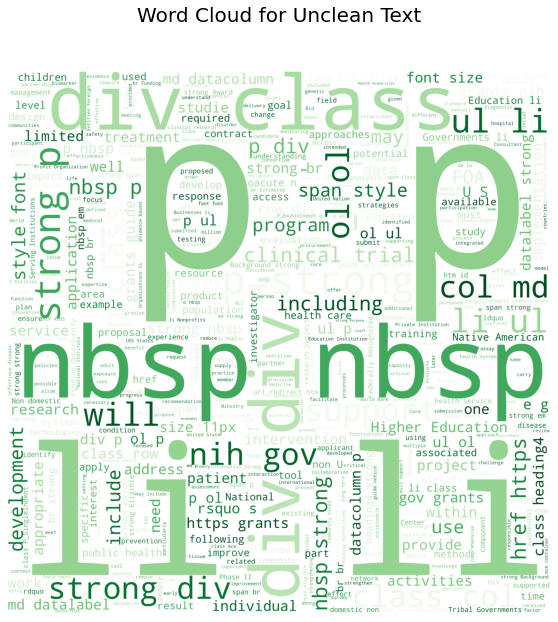

In [446]:
#word cloud for unclean text
draw_wordcloud(train.Text,'Word Cloud for Unclean Text')

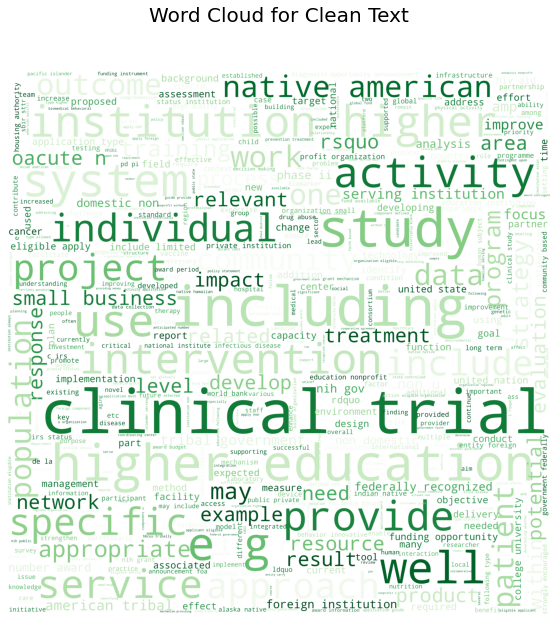

In [447]:
#word cloud for clean text
draw_wordcloud(train.clean_text,'Word Cloud for Clean Text')

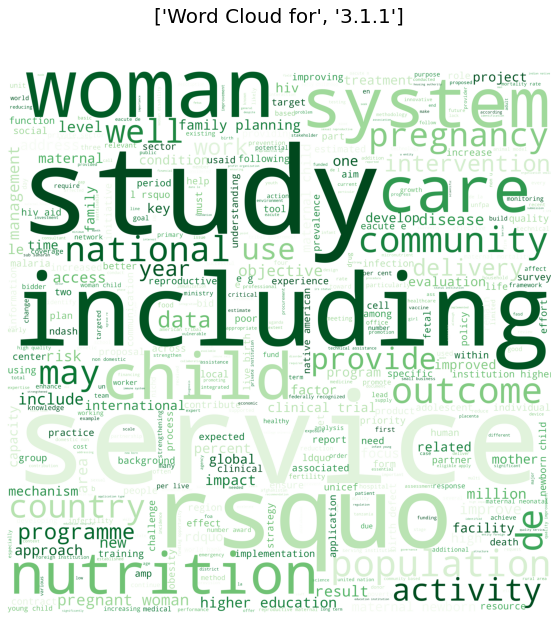

None


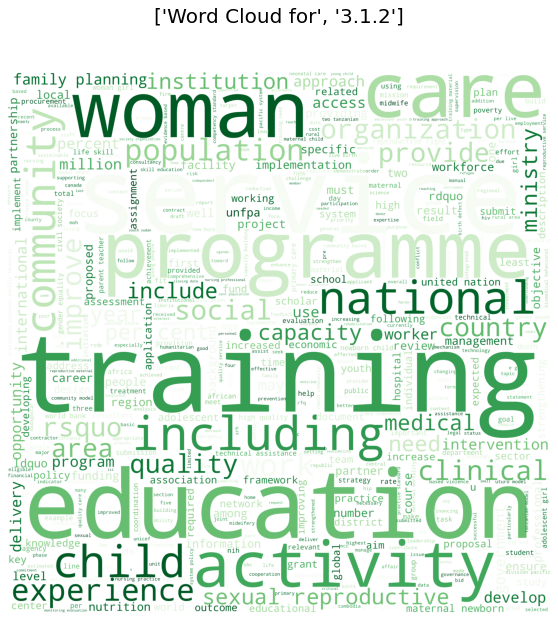

None


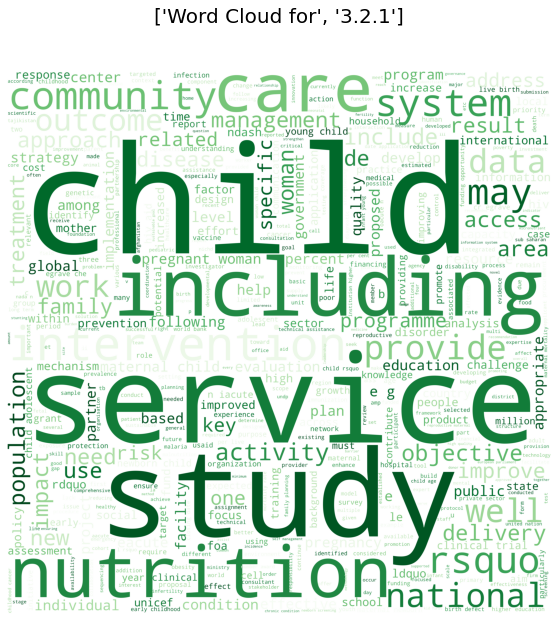

None


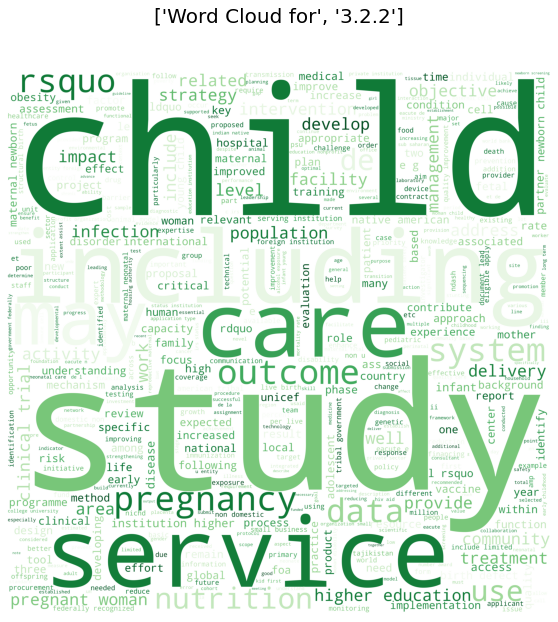

None


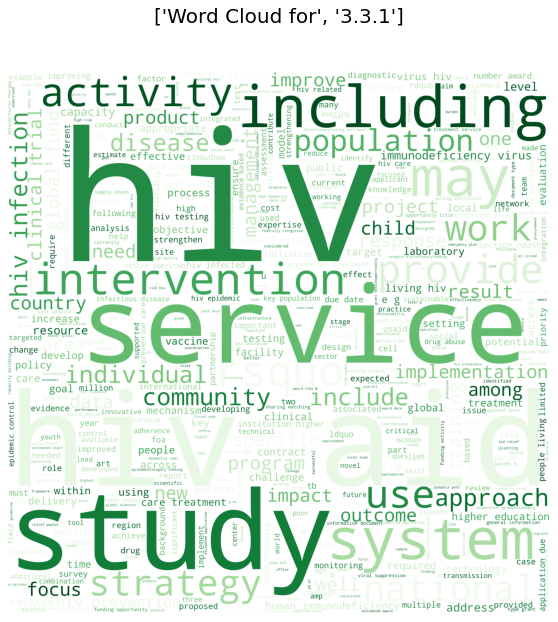

None


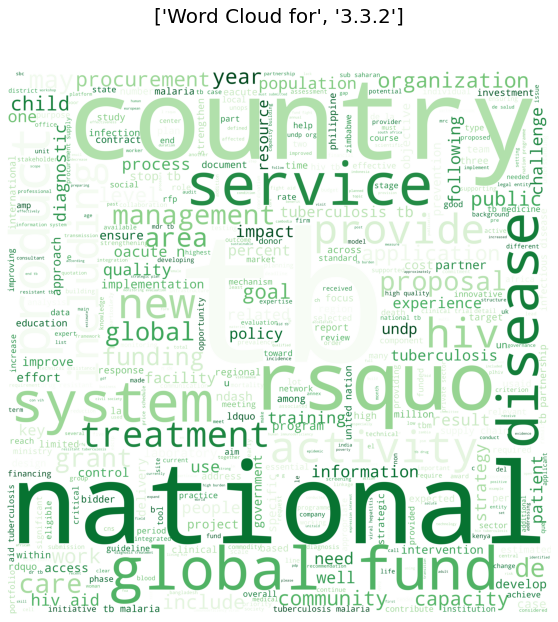

None


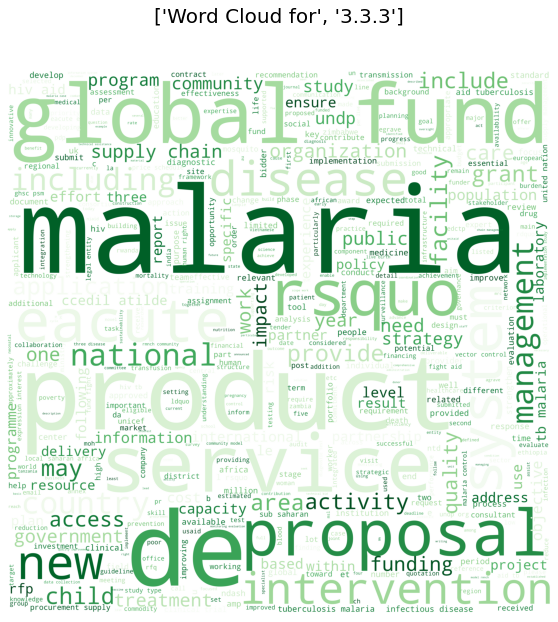

None


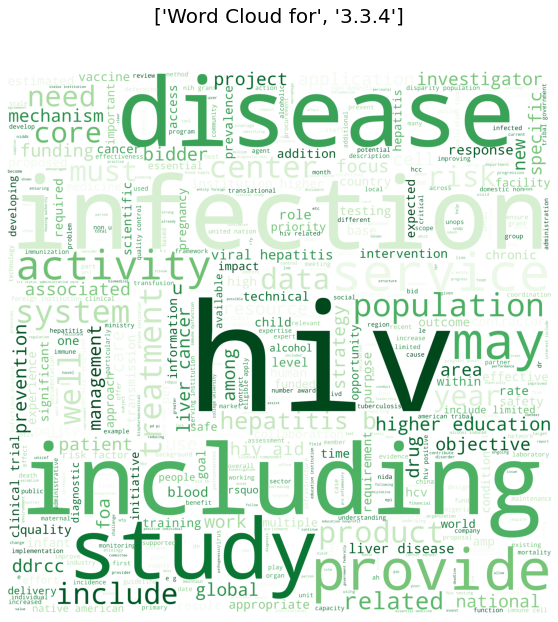

None


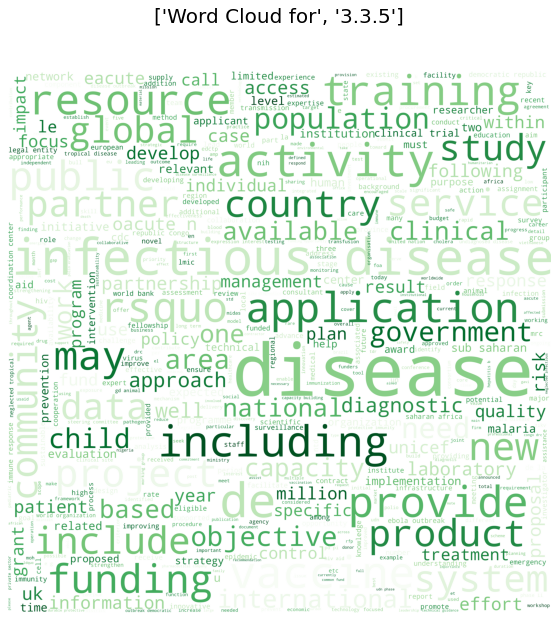

None


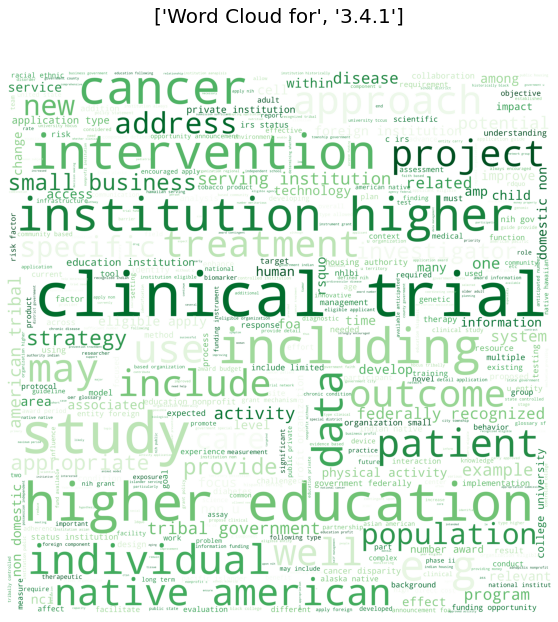

None


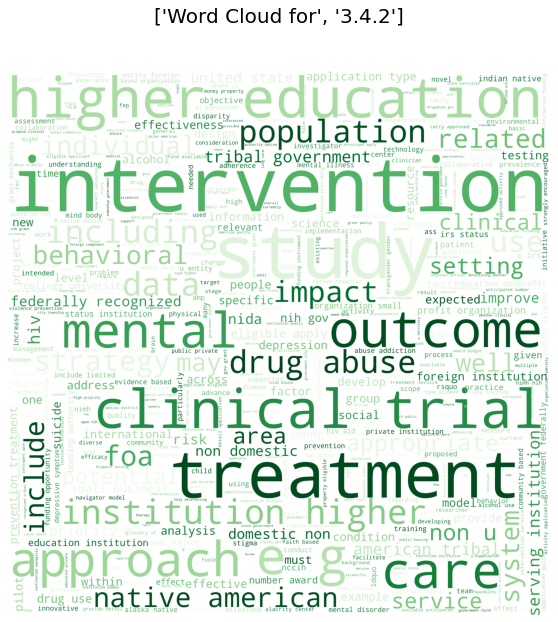

None


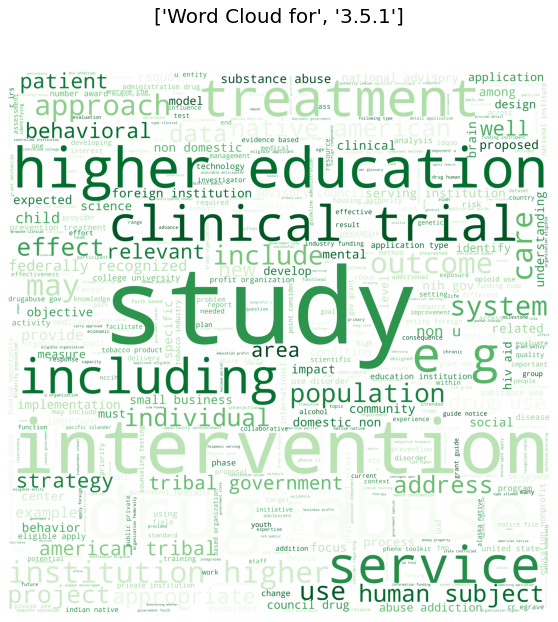

None


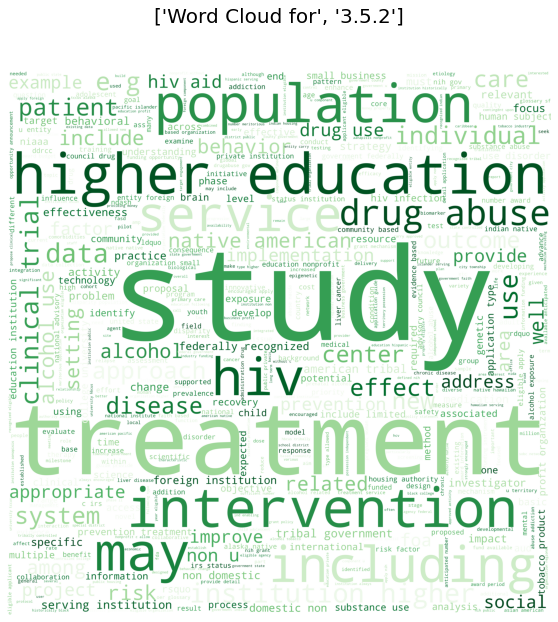

None


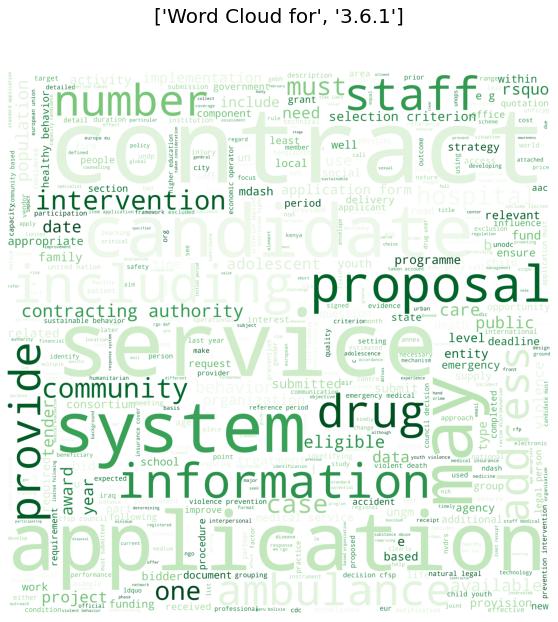

None


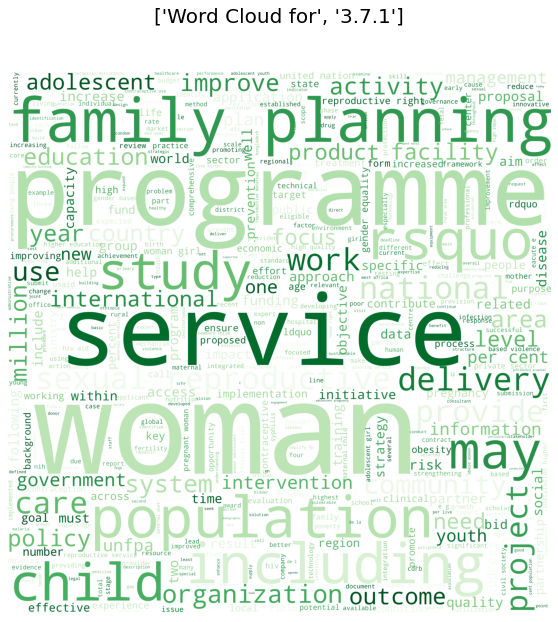

None


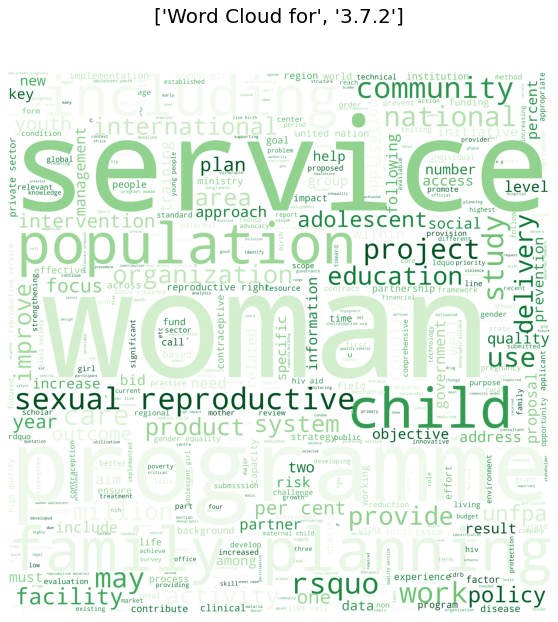

None


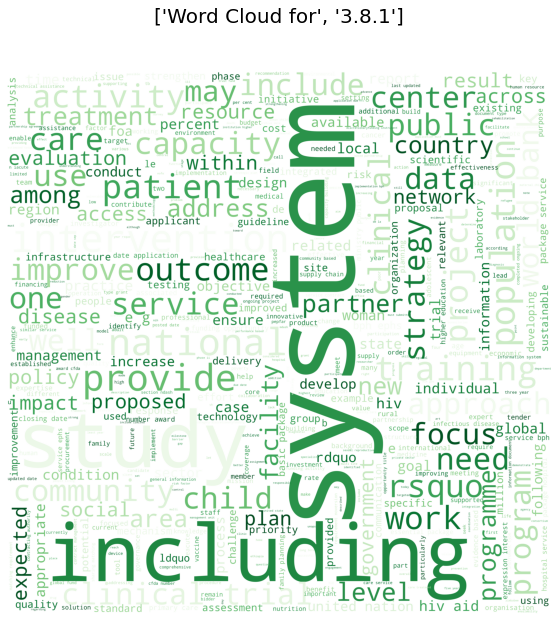

None


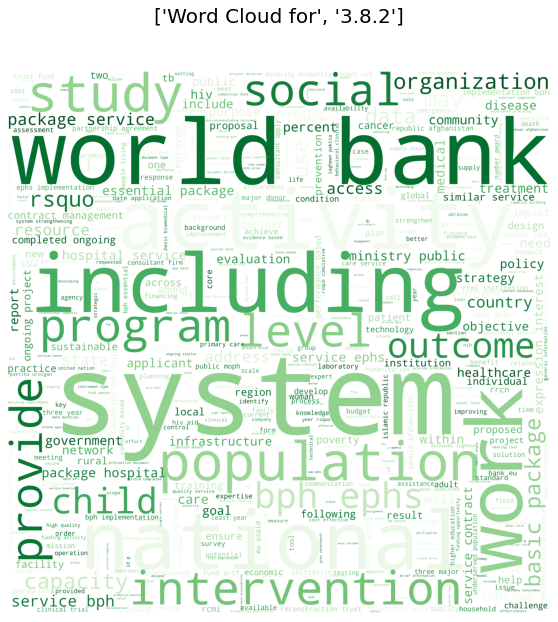

None


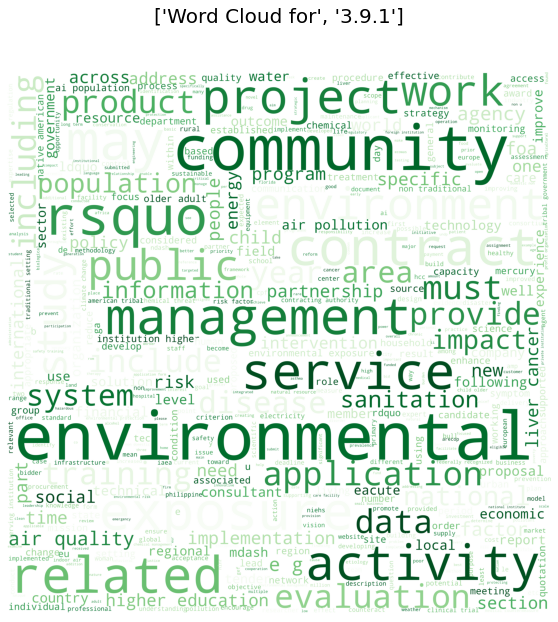

None


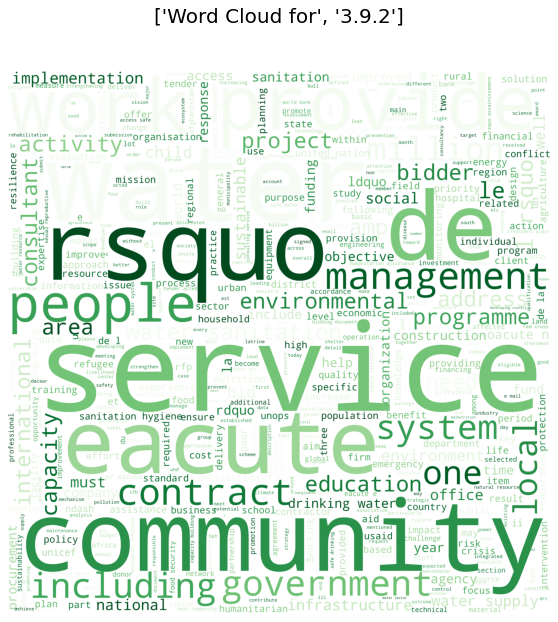

None


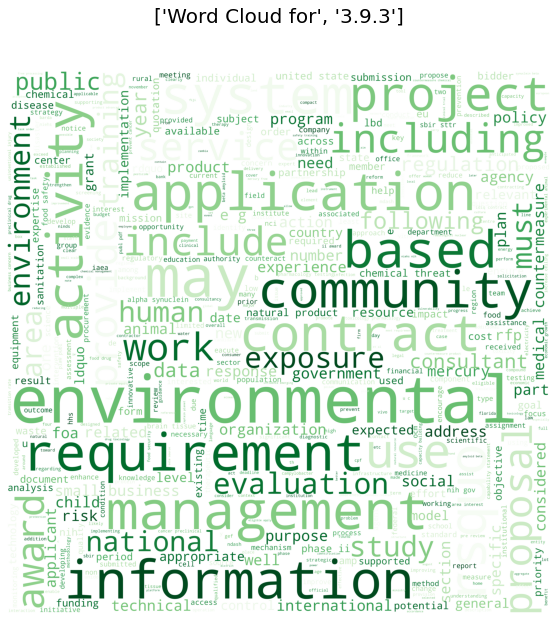

None


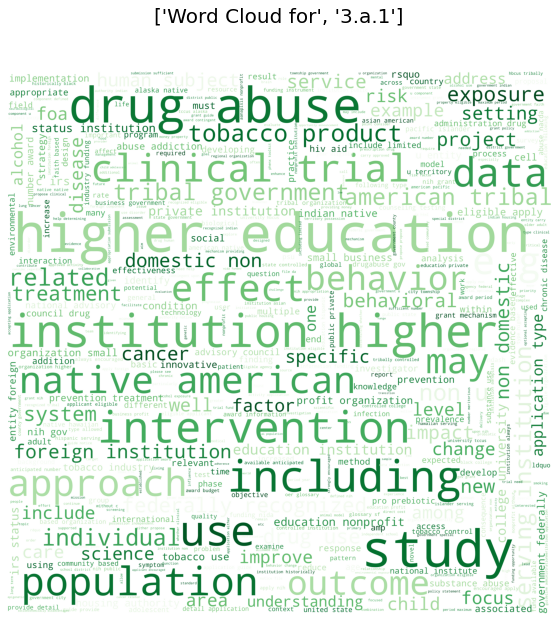

None


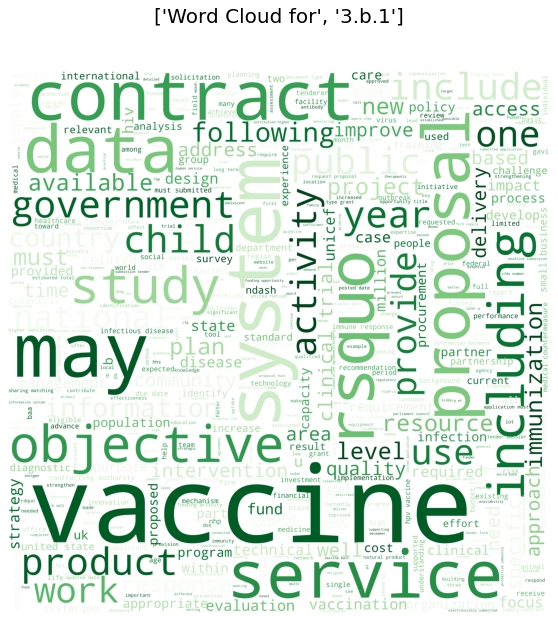

None


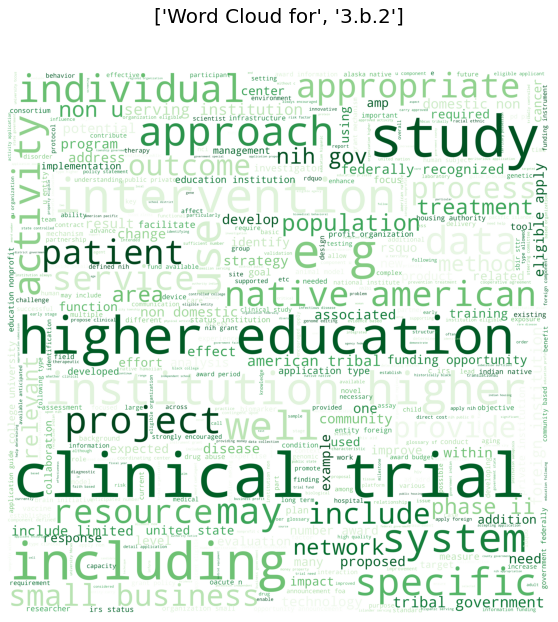

None


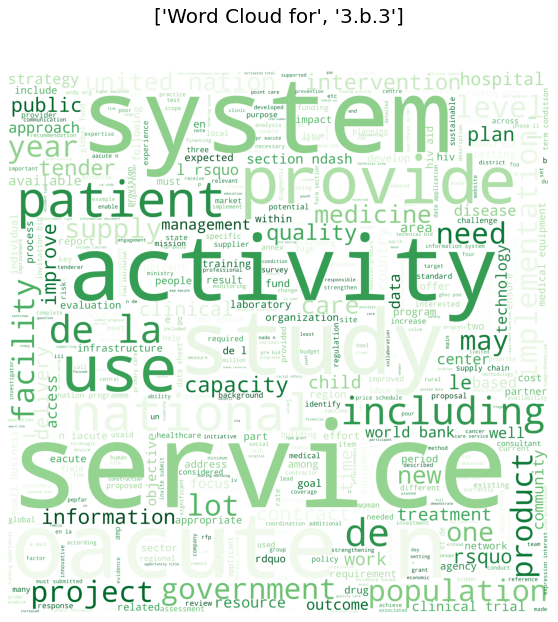

None


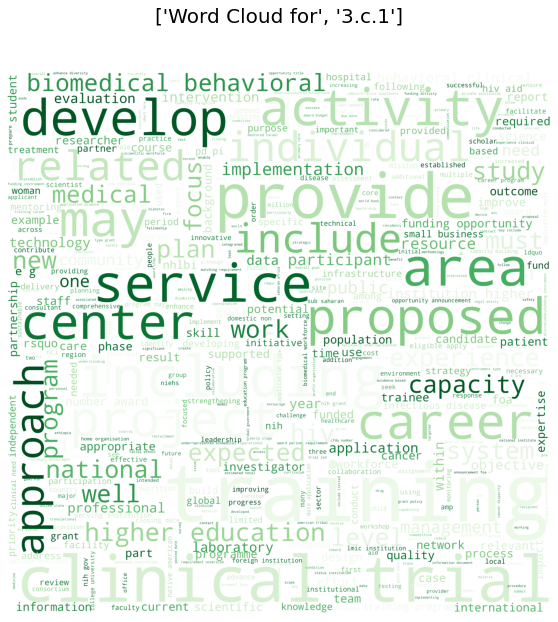

None


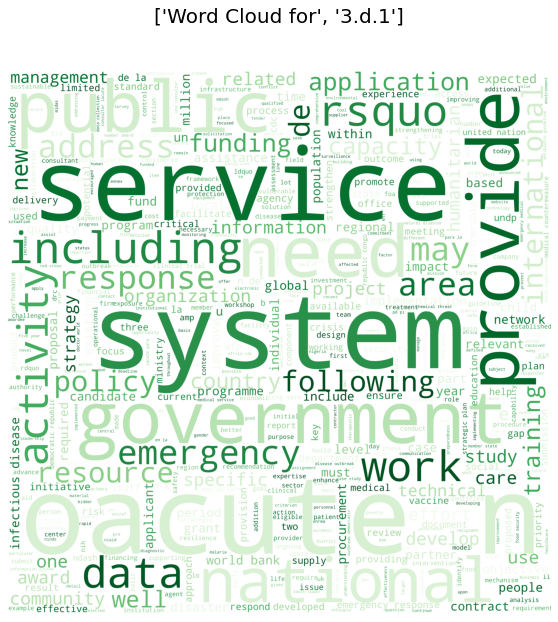

None


In [448]:
#word cloud for individual SDG3 27 indicators
for i in clean_train.columns[3:]:
    graph = clean_train[clean_train[i] == 1]
    print(draw_wordcloud(graph.clean_text,['Word Cloud for',i]))

### Word Counts

In the word count we can see the most repeated words in the text documents and how it spread between each 27 indicators.

In [449]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

cvec = CountVectorizer(stop_words='english')

tvec = TfidfVectorizer(stop_words='english')

In [450]:
#cvec count
cvec_text = cvec.fit_transform(train.clean_text)
cvec_df = pd.DataFrame(cvec_text.todense(),columns=cvec.get_feature_names())
cvec_text_count = cvec_df.sum(axis=0).sort_values(ascending=False)
cvec_text_count.head(10)

clinical       5205
study          4657
application    4565
data           3845
institution    3558
disease        3422
trial          3257
service        3179
care           3057
award          3044
dtype: int64

In [451]:
#exploring word count in all 27 indicators
for i in clean_train.columns[3:]:
    text = clean_train[clean_train[i] == 1]
    cvec_text = cvec.fit_transform(text.clean_text)
    cvec_df = pd.DataFrame(cvec_text.todense(),columns=cvec.get_feature_names())
    cvec_text_count = cvec_df.sum(axis=0)
    print("-----------",i,"Word Count----------\n",cvec_text_count.sort_values(ascending=False).head(10))

----------- 3.1.1 Word Count----------
 child         468
woman         397
maternal      385
eacute        340
rsquo         309
service       258
care          207
community     189
including     173
population    169
dtype: int64
----------- 3.1.2 Word Count----------
 training     150
service      138
education    118
woman        110
care         107
community    105
child         97
quality       88
national      83
based         79
dtype: int64
----------- 3.2.1 Word Count----------
 child        998
service      364
maternal     332
rsquo        307
care         280
study        277
woman        268
community    240
eacute       231
nutrition    225
dtype: int64
----------- 3.2.2 Word Count----------
 child          481
eacute         330
maternal       311
care           299
rsquo          283
woman          271
service        219
institution    210
study          209
including      194
dtype: int64
----------- 3.3.1 Word Count----------
 hiv            2226
aid             58

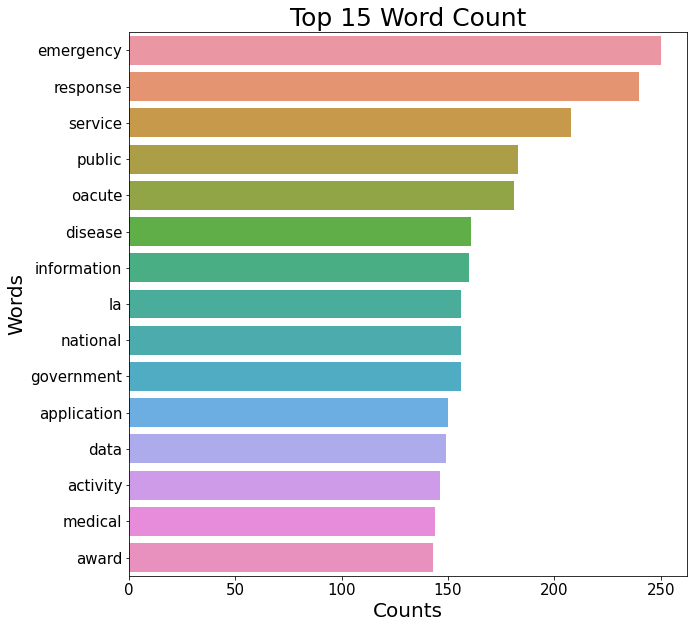

In [452]:
#making new dataframe for wordcount
cvec_data = pd.DataFrame(cvec_text_count)
cvec_data.reset_index(inplace=True)
cvec_data.columns = 'Words','Counts'

#graphing the word count in bar chart
plt.figure(figsize=(10,10))
plt.title('Top 15 Word Count',fontsize=25)

sns.barplot(data=cvec_data.sort_values(by='Counts',ascending=False).head(15),x='Counts',y='Words',orient='h')

plt.xlabel('Counts', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

### Word Weights

In [453]:
#tvec count
tvec_text = tvec.fit_transform(train.clean_text)
tvec_df = pd.DataFrame(tvec_text.todense(),columns=tvec.get_feature_names())
tvec_text_count = tvec_df.sum(axis=0)
tvec_text_count.sort_values(ascending=False).head(10)

diabetes       87.189783
care           70.747144
date           68.165388
hiv            67.696294
service        62.504085
application    58.211853
clinical       53.391978
study          52.409961
child          50.192910
disease        48.996516
dtype: float64

In [454]:
#exploring word weight in all 27 indicators
for i in clean_train.columns[3:]:
    text = clean_train[clean_train[i] == 1]
    tvec_text = tvec.fit_transform(text.clean_text)
    tvec_df = pd.DataFrame(tvec_text.todense(),columns=tvec.get_feature_names())
    tvec_text_count = tvec_df.sum(axis=0)
    print("-----------",i,"Word Weight Count----------\n",tvec_text_count.sort_values(ascending=False).head(10))

----------- 3.1.1 Word Weight Count----------
 maternal        12.801976
child           11.002204
service          7.925721
woman            7.780953
newborn          7.649071
reproductive     5.083443
care             4.996279
mortality        4.923989
diabetes         4.892911
gestational      4.844534
dtype: float64
----------- 3.1.2 Word Weight Count----------
 child           4.115330
maternal        4.017477
service         3.728388
programme       3.485993
care            3.425473
newborn         3.389135
woman           3.388977
reproductive    3.124916
quality         2.962879
training        2.845349
dtype: float64
----------- 3.2.1 Word Weight Count----------
 child        17.787344
maternal     10.799319
newborn       8.494364
service       7.276956
date          7.018888
nutrition     6.305852
woman         6.165432
care          5.680340
hiv           5.293709
community     4.904493
dtype: float64
----------- 3.2.2 Word Weight Count----------
 child        8.339414
mater

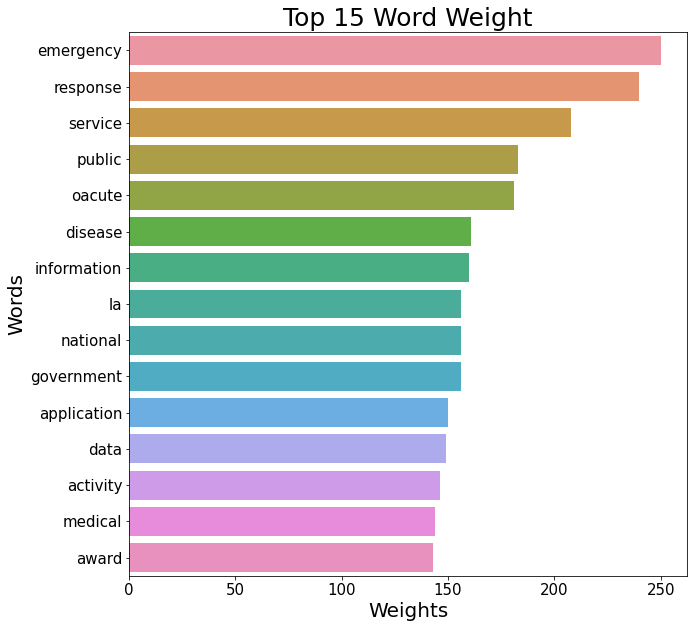

In [455]:
#make dataframe for graphing
tvec_data = pd.DataFrame(cvec_text_count)
tvec_data.reset_index(inplace=True)
tvec_data.columns = 'Words','Weights'

#graphing bar chart for word weight
plt.figure(figsize=(10,10))
plt.title('Top 15 Word Weight',fontsize=25)

sns.barplot(data=tvec_data.sort_values(by='Weights',ascending=False).head(15),x='Weights',y='Words',orient='h')

plt.xlabel('Weights', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

### Word Frequencies

The word count allow us to defined how many times a word is repeated however, it is hard to understand from just count. So I will be exploring how many time the word is repeted in proportion to the total word count shown as frequency in %:

In [456]:
cvec_data['Freq'] = cvec_data['Counts'] / len(cvec_data) * 100
cvec_data.sort_values(by='Counts',ascending=False, inplace=True)
cvec_data

,Words,Counts,Freq
1849,emergency,250,4.059101
4868,response,240,3.896736
5130,service,208,3.377172
4518,public,183,2.971262
3876,oacute,181,2.938789
...,...,...,...
3480,meal,1,0.016236
3482,meaningful,1,0.016236
3483,meant,1,0.016236
3486,measureable,1,0.016236


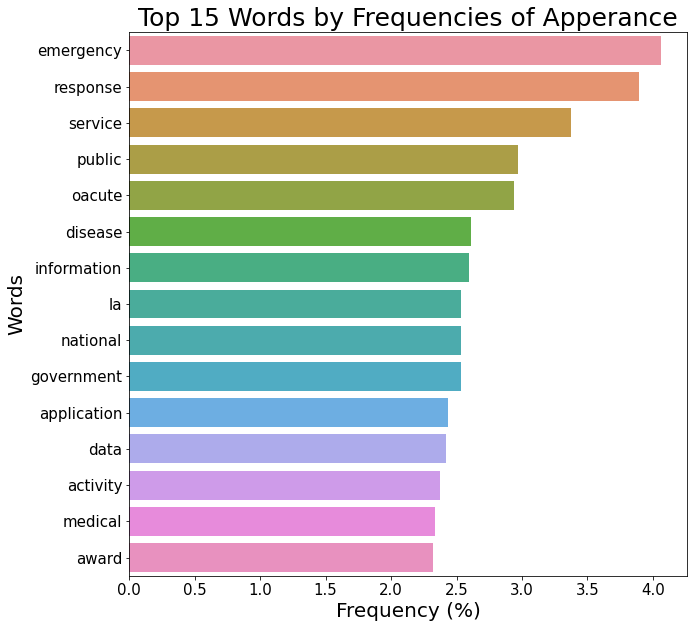

In [457]:
plt.figure(figsize=(10,10))
plt.title('Top 15 Words by Frequencies of Apperance',fontsize=25)

sns.barplot(data=cvec_data.head(15),x='Freq',y='Words',orient='h')

plt.xlabel('Frequency (%)',fontsize=20)
plt.ylabel('Words',fontsize=20)
plt.tick_params(labelsize=15)

### Indicators Count

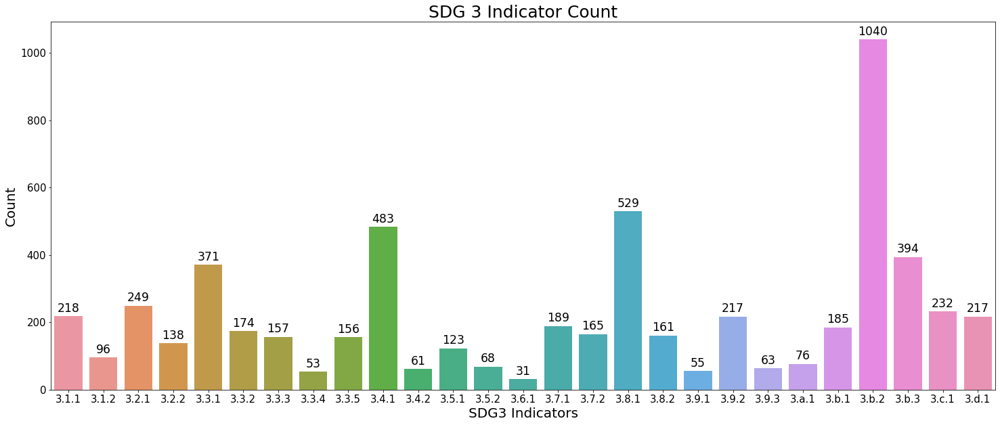

In [458]:
#total number of indicators
indi = pd.DataFrame(clean_train.iloc[:,3:].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = clean_train.iloc[:,3:].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom',fontsize='xx-large')

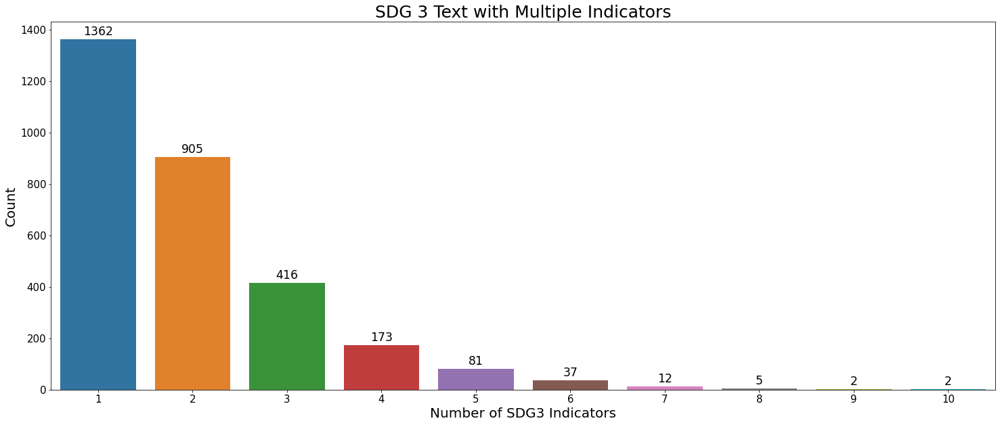

In [459]:
#number of text with multiple indicators
rowtotal = clean_train.iloc[:,3:].sum(axis=1)
rowtotal_df = pd.DataFrame(rowtotal.value_counts())
rowtotal_df.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Text with Multiple Indicators',fontsize=25)

ax = sns.barplot(data=rowtotal_df,x='index',y=0)

plt.xlabel('Number of SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = rowtotal.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom', fontsize='xx-large')

### Text Type

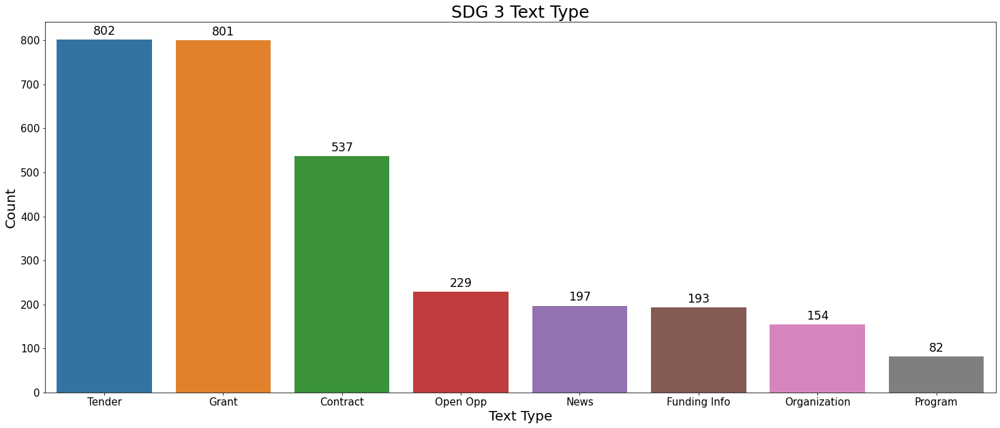

In [460]:
#number of text with multiple indicators
typecount = clean_train.Type.value_counts()
typecount_df = pd.DataFrame(typecount)
typecount_df.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Text Type',fontsize=25)

ax = sns.barplot(data=typecount_df,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = typecount_df.Type.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom', fontsize='xx-large')

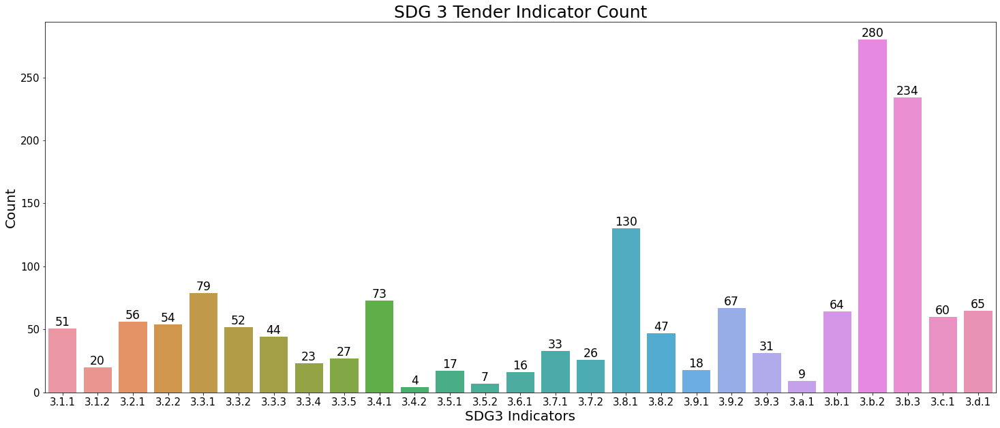

In [461]:
indi = pd.DataFrame(tender_text.iloc[:,3:30].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Tender Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = tender_text.iloc[:,3:30].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

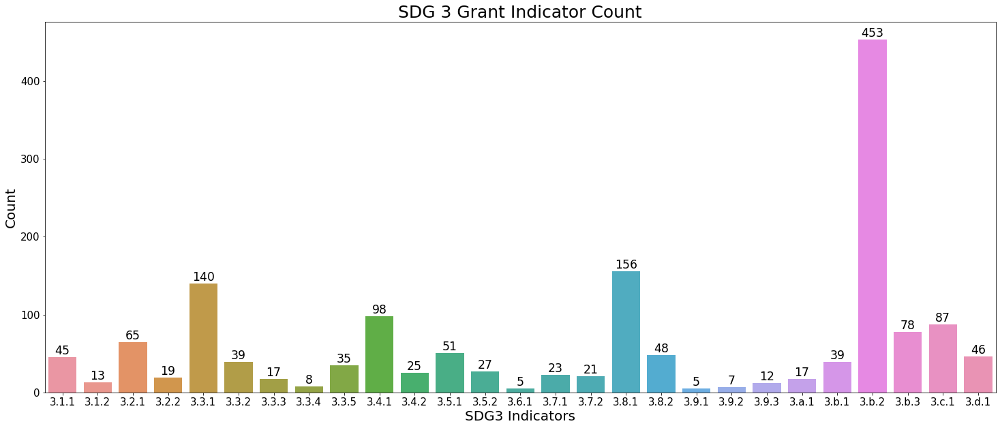

In [462]:
indi = pd.DataFrame(grant_text.iloc[:,3:30].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Grant Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = grant_text.iloc[:,3:30].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

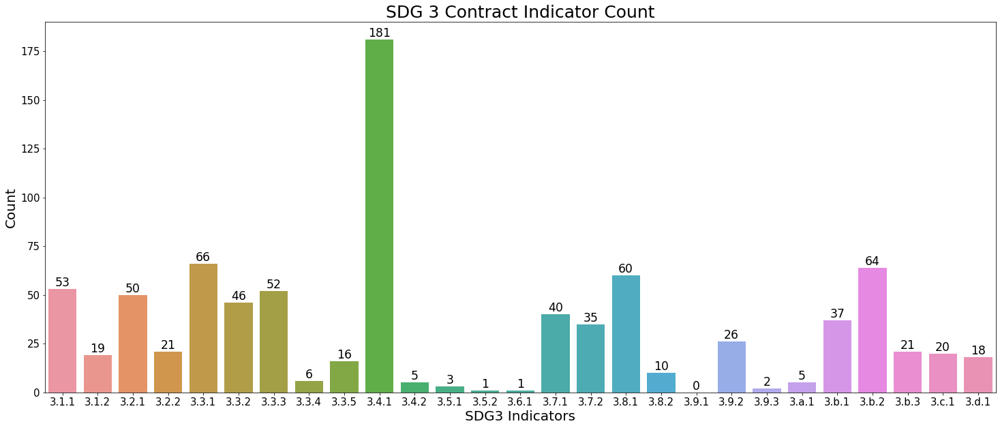

In [463]:
indi = pd.DataFrame(contract_text.iloc[:,3:30].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Contract Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = contract_text.iloc[:,3:30].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

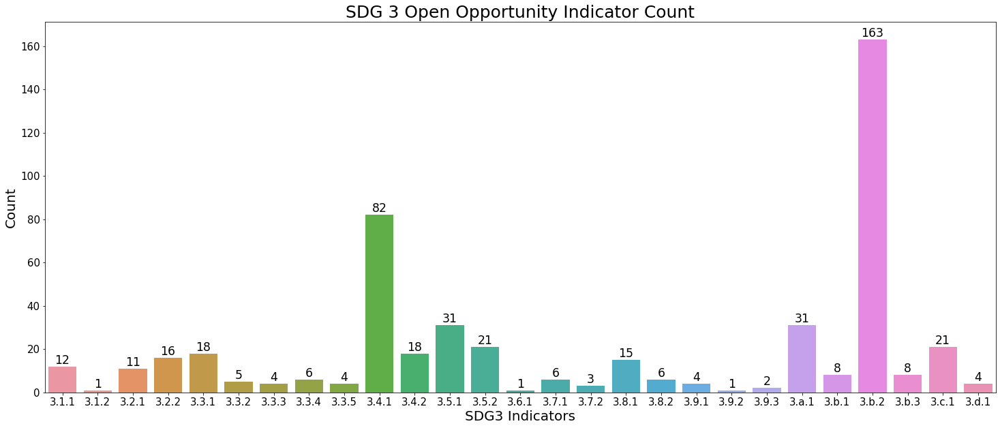

In [464]:
indi = pd.DataFrame(opp_text.iloc[:,3:30].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Open Opportunity Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = opp_text.iloc[:,3:30].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

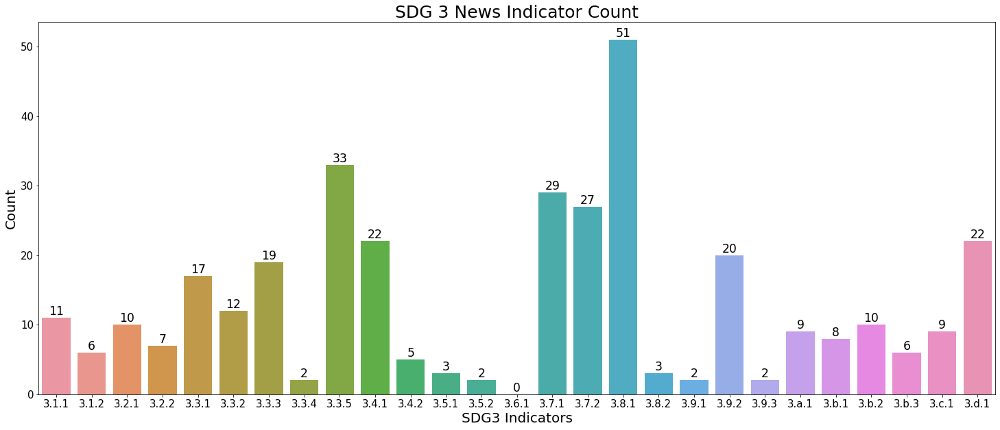

In [465]:
indi = pd.DataFrame(news_text.iloc[:,3:30].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 News Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = news_text.iloc[:,3:30].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

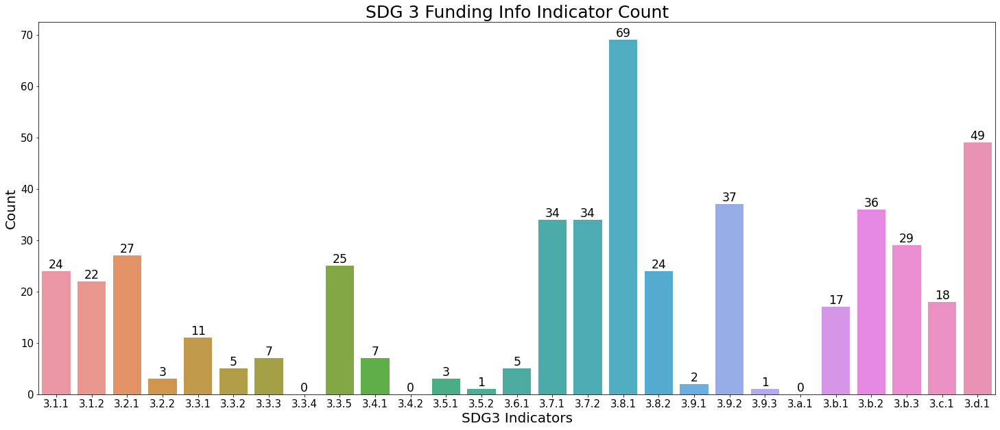

In [466]:
indi = pd.DataFrame(fund_text.iloc[:,3:30].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Funding Info Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = fund_text.iloc[:,3:30].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

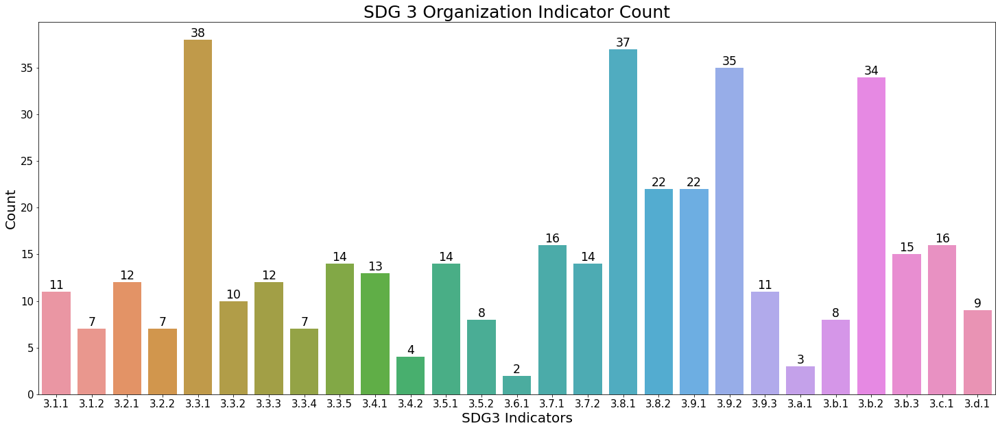

In [467]:
indi = pd.DataFrame(org_text.iloc[:,3:30].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Organization Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = org_text.iloc[:,3:30].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height , label, ha='center', va='bottom',fontsize='xx-large')

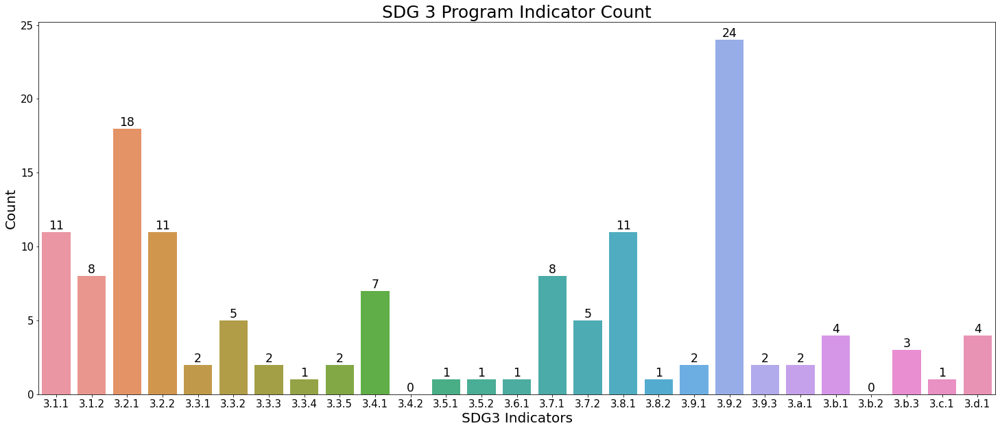

In [468]:
indi = pd.DataFrame(program_text.iloc[:,3:30].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Program Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = program_text.iloc[:,3:30].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

---
# Test Data

This dataset includes the columns ID, Type, and Text.

In [469]:
test = pd.read_csv('data/Devex_test_questions.csv')

In [470]:
test

,Unique ID,Type,Text
0,49848,Organization,4th Sector Health: <p>4th Sector Health is a U...
1,52348,Organization,Action for Global Health: <p>Action for Global...
2,103541,Organization,Scottish Association for Mental Health (SAMH):...
3,52382,Organization,Singapore Immunology Network: <p>The Singapore...
4,47212,Organization,Coastal Conservation and Education Foundation ...
...,...,...,...
993,38108,Program,\r Ulaanbaatar Air Quality Improvement Program...
994,30360,Program,Supporting National Urban Health Mission<p>Thr...
995,33883,Program,WHO Contingency Fund - 2015<p>The project aims...
996,36296,Program,Lebanon Health Resilience Project<p>The projec...


### Clean Test Data

In [471]:
#clean test data set
clean_test_text=[]

for text in test.Text:
    clean_test_text.append(text_to_words(text))

In [472]:
clean_test_text

['th sector th sector usaid initiative form alliance exchange advance latin america caribbean mobilize business community expert bring sustainable solution public issue affect equitable maternal child reproductive disease hiv aid solving problem together th sector seek cultivate locally driven solution challenge latin america caribbean use two approach mobilize various sector region use share resource towards maximizing impact alliance develop public private alliance private company ngo government foundation develop fund implement activity invest usaid fund leverage partner contribution foster greater private sector involvement latin america caribbean alliance also help build capacity partner work across sector improve region exchange exchange across country latin america caribbean enable south south cross fertilization expertise best practice lesson learned program team th sector usaid initiative led abt associate inc collaboration rti international forum one communication service con

In [473]:
test['clean_text'] = clean_test_text
test

,Unique ID,Type,Text,clean_text
0,49848,Organization,4th Sector Health: <p>4th Sector Health is a U...,th sector th sector usaid initiative form alli...
1,52348,Organization,Action for Global Health: <p>Action for Global...,action global action global afgh broad europea...
2,103541,Organization,Scottish Association for Mental Health (SAMH):...,scottish association mental samh around since ...
3,52382,Organization,Singapore Immunology Network: <p>The Singapore...,singapore immunology network singapore immunol...
4,47212,Organization,Coastal Conservation and Education Foundation ...,coastal conservation education foundation ccef...
...,...,...,...,...
993,38108,Program,\r Ulaanbaatar Air Quality Improvement Program...,ulaanbaatar air quality improvement government...
994,30360,Program,Supporting National Urban Health Mission<p>Thr...,supporting national urban missionthrough adb r...
995,33883,Program,WHO Contingency Fund - 2015<p>The project aims...,contingency fund aim contingency fund better p...
996,36296,Program,Lebanon Health Resilience Project<p>The projec...,lebanon resilience projectthe objective pdo in...


In [474]:
clean_test = test[['Unique ID', 'Type', 'clean_text']]
clean_test

,Unique ID,Type,clean_text
0,49848,Organization,th sector th sector usaid initiative form alli...
1,52348,Organization,action global action global afgh broad europea...
2,103541,Organization,scottish association mental samh around since ...
3,52382,Organization,singapore immunology network singapore immunol...
4,47212,Organization,coastal conservation education foundation ccef...
...,...,...,...
993,38108,Program,ulaanbaatar air quality improvement government...
994,30360,Program,supporting national urban missionthrough adb r...
995,33883,Program,contingency fund aim contingency fund better p...
996,36296,Program,lebanon resilience projectthe objective pdo in...


In [475]:
clean_test.to_csv('data/clean_test.csv',index=False)

### Test Data Visualization

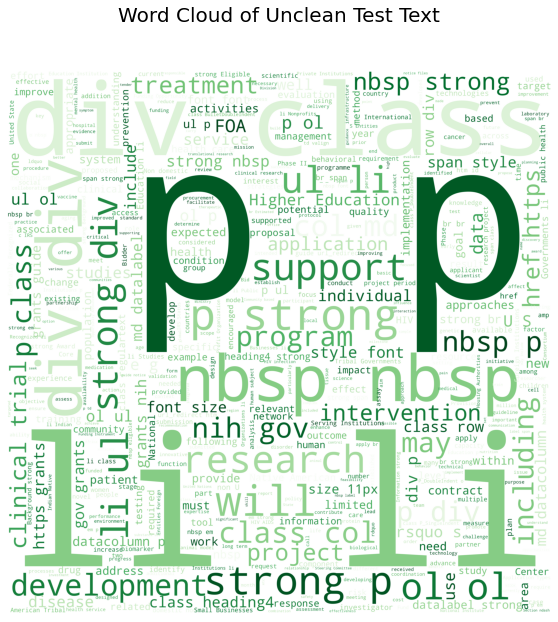

In [476]:
#word cloud of unclean text
draw_wordcloud(test.Text, "Word Cloud of Unclean Test Text")

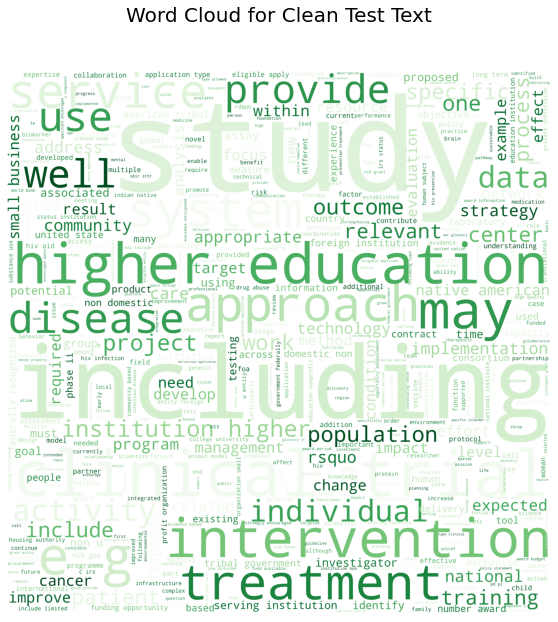

In [477]:
#word cloud of clean test text
draw_wordcloud(test.clean_text, "Word Cloud for Clean Test Text")

In [478]:
#cvec test count
cvec_test = cvec.fit_transform(test.clean_text)
cvec_test_df = pd.DataFrame(cvec_test.todense(),columns=cvec.get_feature_names())
cvec_test_count = cvec_test_df.sum(axis=0)
cvec_test_count.sort_values(ascending=False).head(10)

study          1818
clinical       1703
application    1646
institution    1351
data           1249
disease        1132
award          1109
use            1041
care           1038
hiv            1034
dtype: int64

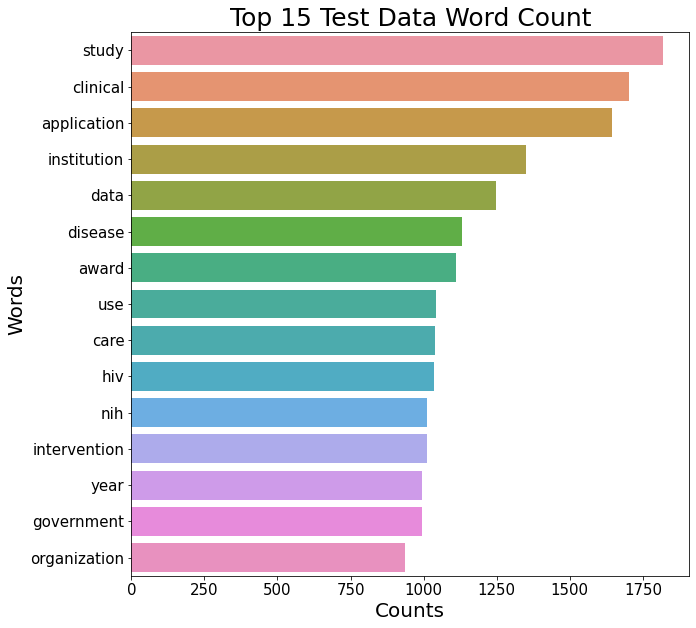

In [479]:
#making new dataframe for wordcount
cvec_test_data = pd.DataFrame(cvec_test_count)
cvec_test_data.reset_index(inplace=True)
cvec_test_data.columns = 'Words','Counts'

#graphing the word count in bar chart
plt.figure(figsize=(10,10))
plt.title('Top 15 Test Data Word Count',fontsize=25)

sns.barplot(data=cvec_test_data.sort_values(by='Counts',ascending=False).head(15),x='Counts',y='Words',orient='h')

plt.xlabel('Counts', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

In [480]:
cvec_test_data['Freq'] = cvec_test_data['Counts'] / len(cvec_data) * 100
cvec_test_data.sort_values(by='Counts',ascending=False, inplace=True)
cvec_test_data

,Words,Counts,Freq
13059,study,1818,29.517779
2314,clinical,1703,27.650593
824,application,1646,26.725118
6902,institution,1351,21.935379
3264,data,1249,20.279266
...,...,...,...
7280,jnci,1,0.016236
7277,jinzj,1,0.016236
7276,jin,1,0.016236
7275,jihae,1,0.016236


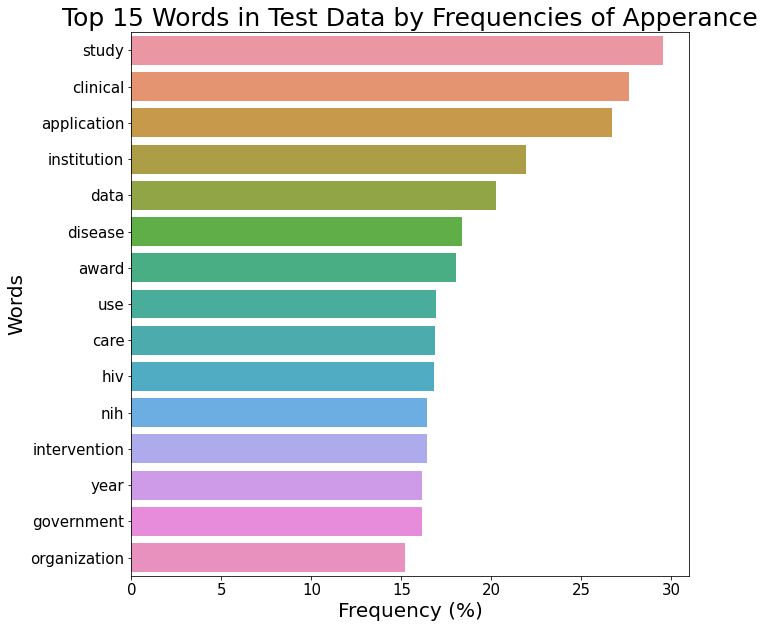

In [481]:
plt.figure(figsize=(10,10))
plt.title('Top 15 Words in Test Data by Frequencies of Apperance',fontsize=25)

sns.barplot(data=cvec_test_data.head(15),x='Freq',y='Words',orient='h')

plt.xlabel('Frequency (%)',fontsize=20)
plt.ylabel('Words',fontsize=20)
plt.tick_params(labelsize=15)